# **Marketing Campaign Analysis**

## **Problem Definition**

### **The Context:**

 - Why is this problem important to solve?

 The problem being solved here is that the customer database is not yet segmented and therefore not fully understood. It is important to solve this problem because companies need to understand their customers in order to get a complete picture of who they are selling to. This will inform marketing campaigns, provide financial insights as to which group(s) bring in the most profit, and identify gaps in the customer database to do more analysis and exploration.

### **The objective:**

 - What is the intended goal?

 The intended goal is to complete Exploratory Data Analysis (EDA) to gain an initial impression of the customer database. After that, we will perform a collection of clustering algorithms to segment the data into meaningful groups. Finally, we can draw data-driven conclusions based on the insights uncovered by the EDA and clustering.

### **The key questions:**

- What are the key questions that need to be answered?

The key questions are:
- How many customers are in the dataset?
- What groups do our customers cluster into?
- What are the characteristics of those clusters?
- What factors explain the variance in the data?
- Which clustering method(s) is/are best to use on this data set and why?
- What conclusions can we draw from EDA and clustering analysis?
- Are there any gaps in the data and what other data would be useful to perform further analysis?

### **The problem formulation**:

- What is it that we are trying to solve using data science?

The problem we are trying to solve using data science is a the lack of segmentation and analysis in a dataset which currently contains unrevealed insights and conclusions. By uncovering insights and conclusions, we can better understand the customers and drive business decisions.

------------------------------
## **Data Dictionary**
------------------------------

The dataset contains the following features:

1. ID: Unique ID of each customer
2. Year_Birth: Customer’s year of birth
3. Education: Customer's level of education
4. Marital_Status: Customer's marital status
5. Kidhome: Number of small children in customer's household
6. Teenhome: Number of teenagers in customer's household
7. Income: Customer's yearly household income in USD
8. Recency: Number of days since the last purchase
9. Dt_Customer: Date of customer's enrollment with the company
10. MntFishProducts: The amount spent on fish products in the last 2 years
11. MntMeatProducts: The amount spent on meat products in the last 2 years
12. MntFruits: The amount spent on fruits products in the last 2 years
13. MntSweetProducts: Amount spent on sweet products in the last 2 years
14. MntWines: The amount spent on wine products in the last 2 years
15. MntGoldProds: The amount spent on gold products in the last 2 years
16. NumDealsPurchases: Number of purchases made with discount
17. NumCatalogPurchases: Number of purchases made using a catalog (buying goods to be shipped through the mail)
18. NumStorePurchases: Number of purchases made directly in stores
19. NumWebPurchases: Number of purchases made through the company's website
20. NumWebVisitsMonth: Number of visits to the company's website in the last month
21. AcceptedCmp1: 1 if customer accepted the offer in the first campaign, 0 otherwise
22. AcceptedCmp2: 1 if customer accepted the offer in the second campaign, 0 otherwise
23. AcceptedCmp3: 1 if customer accepted the offer in the third campaign, 0 otherwise
24. AcceptedCmp4: 1 if customer accepted the offer in the fourth campaign, 0 otherwise
25. AcceptedCmp5: 1 if customer accepted the offer in the fifth campaign, 0 otherwise
26. Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
27. Complain: 1 If the customer complained in the last 2 years, 0 otherwise

**Note:** You can assume that the data is collected in the year 2016.

## **Import the necessary libraries and load the data**

In [ ]:
!pip install scikit-learn-extra
!pip install pyclustering #Installing pyclustering for Kmedoids as I was getting an error importing it

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 22.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyclustering: filename=pyclustering-0.10.1.2-py3-none-any.whl size=2395100 sha256=375f5ed7f9e3d01578d074bb3b79fbedabf5201322adc2cc826efda8c3ac75bd
  Stored in directory: /root/.cache/pip/wheels/9f/99/15/e881f46a92690ae77c2e3b255b89ea45d3a867b1b6c2ab3ba9
Successfully built pyclustering


In [ ]:
#Import libraries for data manipulation
import numpy as np
import pandas as pd

#Import libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

#Import PCA, Scalar, K-Means, and Silhouette from sklearn
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

#Import Kmedoids from Pyclustering
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.cluster import cluster_visualizer
from pyclustering.utils import calculate_distance_matrix

#Import inkage, dendrogram, cophenet, fcluster, pdist from scipy.cluster.hierarchy
from scipy.cluster.hierarchy import linkage, dendrogram, cophenet, fcluster
from scipy.spatial.distance import pdist

#Import DBSCAN from sklearn.cluster
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

#Import GMM from sklearn.mixture
from sklearn.mixture import GaussianMixture

In [ ]:
from google.colab import files
uploaded = files.upload() #Loading the data

Saving marketing_campaign.csv to marketing_campaign.csv


## **Data Overview**

- Reading the dataset
- Understanding the shape of the dataset
- Checking the data types
- Checking for missing values
- Checking for duplicated values
- Drop the column which has no null values

####Reading the dataset

In [ ]:
df = pd.read_csv('marketing_campaign.csv') #Reading the data

####Understanding the shape of the dataset

In [ ]:
df.shape #Shows shape of the df

(2240, 27)

####Checking the data types

In [ ]:
df.info() #Provides info for the dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [ ]:
#Converting the Dt_Customer to datetime format
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')

####Checking for missing values

In [ ]:
df.isnull().sum() #Finds NA values per column
print("The only column with missing values is Income with 24 missing values. ")

The only column with missing values is Income with 24 missing values. 


####Checking for duplicated values

In [ ]:
df.duplicated().sum() #Finds duplicated rows
print("There are no duplicated rows in the dataset.")

There are no duplicated rows in the dataset.


In [ ]:
df['ID'].duplicated().sum() #Finds duplicated IDs

np.int64(0)

####Drop the column which has no null values

In [ ]:
#Task is unclear: dropping a column just because it doesn't have null values is typically not necessary.
#No columns will be dropped, but "Income" (containing null values) will be filled with the median value.

total_na = df['Income'].isnull().sum() #Sums total NA values in 'Income'
print("The initial dataset has " + str(total_na) + " missing values in column Income.")
print("")

df2 = df.copy() #Creates a copy of df called df2

rounded_median_df = round((df2['Income']).median()) #Finds the median of the column 'Income' and rounds to the nearest whole number

df2['Income'] = df2['Income'].fillna(rounded_median_df) #Fills the empty values of df 'Income' with the median of 'Income'

total_na_after = df2['Income'].isna().sum() #Checks the total of NaN values in the dataframe

print("df2 is created. The missing values in 'Income' are now filled with the median of the column. There are " + str(total_na_after) + " missing values in the dataframe df2.")

The initial dataset has 24 missing values in column Income.

df2 is created. The missing values in 'Income' are now filled with the median of the column. There are 0 missing values in the dataframe df2.


#### **Observations and Insights from the Data overview:**

There are 2240 rows/customers in this dataset and 27 columns/metrics. There are 1 float64, 23 int64, and 3 object datatypes in the initial dataset where only 1 column "Income" has null values. There are no duplicated rows, or duplicate IDs in the dataset.

With no duplicates, few missing values, and many numeric columns, this dataset is well-suited for EDA and clustering analysis.

## **Exploratory Data Analysis (EDA)**


- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions:**

1. What is the summary statistics of the data? Explore summary statistics for numerical variables and the categorical variables
2. Find out number of unique observations in each category of categorical columns? Write your findings/observations/insights
3. Are all categories different from each other or can we combine some categories? Is 2n Cycle different from Master?
4. There are 8 categories in Marital_Status with some categories having very low count of less than 5. Can we combine these categories with other categories?

####1. What is the summary statistics of the data? Explore summary statistics for numerical variables and the categorical variables

In [ ]:
df2.describe() #Provides summary statistics for numerical variables

,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
count,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,5592.159821,1968.805804,52237.980804,0.444196,0.506250,2013-07-10 10:01:42.857142784,49.109375,303.935714,26.302232,166.950000,...,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.012946,0.009375,0.149107
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,2012-07-30 00:00:00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2828.250000,1959.000000,35538.750000,0.000000,0.000000,2013-01-16 00:00:00,24.000000,23.750000,1.000000,16.000000,...,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5458.500000,1970.000000,51382.000000,0.000000,0.000000,2013-07-08 12:00:00,49.000000,173.500000,8.000000,67.000000,...,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,8427.750000,1977.000000,68289.750000,1.000000,1.000000,2013-12-30 06:00:00,74.000000,504.250000,33.000000,232.000000,...,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,2014-06-29 00:00:00,99.000000,1493.000000,199.000000,1725.000000,...,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
std,3246.662198,11.984069,25037.955707,0.538398,0.544538,NaN,28.962453,336.597393,39.773434,225.715373,...,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.113069,0.096391,0.356274


In [ ]:
df2.describe(include='object') #Provides summary statistics for categorical variables

,Education,Marital_Status
count,2240,2240
unique,5,8
top,Graduation,Married
freq,1127,864


Summary exploration: There are 24 numerical, 1 datetime, and 2 categorical variables. Of the numeric variables, the income has the highest max and standard deviation. Variables like AcceptedCmp1/2/3/4/5, Complain, and Response have a max value of 1 which contributes to a lower std (<1) for those variables. Of the categorical variables, Marital_Status has 8 unique values and Education has 5 -- the content of these variables will be explored to determine whether they can be simplified. This summary will guide the next steps in data cleaning and transformation to ensure that the dataset is preprared for clustering.

####2.Find out number of unique observations in each category of categorical columns? Write your findings/observations/insights

In [ ]:
df2_categorical = df2[['Education', 'Marital_Status']].copy() #Creates a copy of df2 with only the categorical columns

df2_categorical.nunique() #Counts the number of unique entries in the categorical columns


,0
Education,5
Marital_Status,8


In [ ]:
#Displays unique entries in each categorical column
for col in df2_categorical.columns:
    print(f"Unique values in '{col}':")
    print(df2_categorical[col].unique())
    print('-' * 40)

Unique values in 'Education':
['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle']
----------------------------------------
Unique values in 'Marital_Status':
['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO']
----------------------------------------


Findings/observations/insights: There are 5 unique values in Education and 8 in Marital_Status. Some of these values are similar enough that they can be combined, such as '2n Cycle' and 'Master'. Combining variables will simplify the dataset to prepare it for clustering. Further analysis will be conducted to identify the frequency of these variables to understand the impact of changing them.

####3.Are all categories different from each other or can we combine some categories? Is 2n Cycle different from Master?

In [ ]:
print("2n Cycle means a Master's degree, so those can be combined.")

df3 = df2.copy() #Creates df3 from df2
df3['Education'] = df3['Education'].replace('2n Cycle', 'Master')#Replaces 2n Cycle with Master in df3

2n Cycle means a Master's degree, so those can be combined.


####4. There are 8 categories in Marital_Status with some categories having very low count of less than 5. Can we combine these categories with other categories?

In [ ]:
df3['Marital_Status'].value_counts()

,count
Marital_Status,
Married,864
Together,580
Single,480
Divorced,232
Widow,77
Alone,3
Absurd,2
YOLO,2


The categories 'Alone', 'Absurd', and 'YOLO', occur less than 5 times. In order to simplify the dataset, they will be combined with 'Single'. One reservation in doing so is that those customers are not actually single, but the frequency is so low that it is worth simplifying the dataset by assuming that they are.

In [ ]:
df4 = df3.copy() #Creates df4 from df3
df4['Marital_Status'] = df4['Marital_Status'].replace(('Alone', 'Absurd', 'YOLO'), 'Single')
df4['Marital_Status'].value_counts()

,count
Marital_Status,
Married,864
Together,580
Single,487
Divorced,232
Widow,77


### **Univariate Analysis on Numerical and Categorical data**

Univariate analysis is used to explore each variable in a data set, separately. It looks at the range of values, as well as the central tendency of the values. It can be done for both numerical and categorical variables.

- Plot histogram and box plot for different numerical features and understand how the data looks like.
- Explore the categorical variables like Education, Kidhome, Teenhome, Complain.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Leading Questions**:
1. How does the distribution of Income variable vary across the dataset?
2. The histogram and the box plot are showing some extreme value on the right side of the distribution of the 'Income' feature. Can we consider them as outliers and remove or should we analyze these extreme values?
3. There are only a few rows with extreme values for the Income variable. Is that enough information to treat (or not to treat) them? At what percentile the upper whisker lies?


####Initial exploration of numerical variables

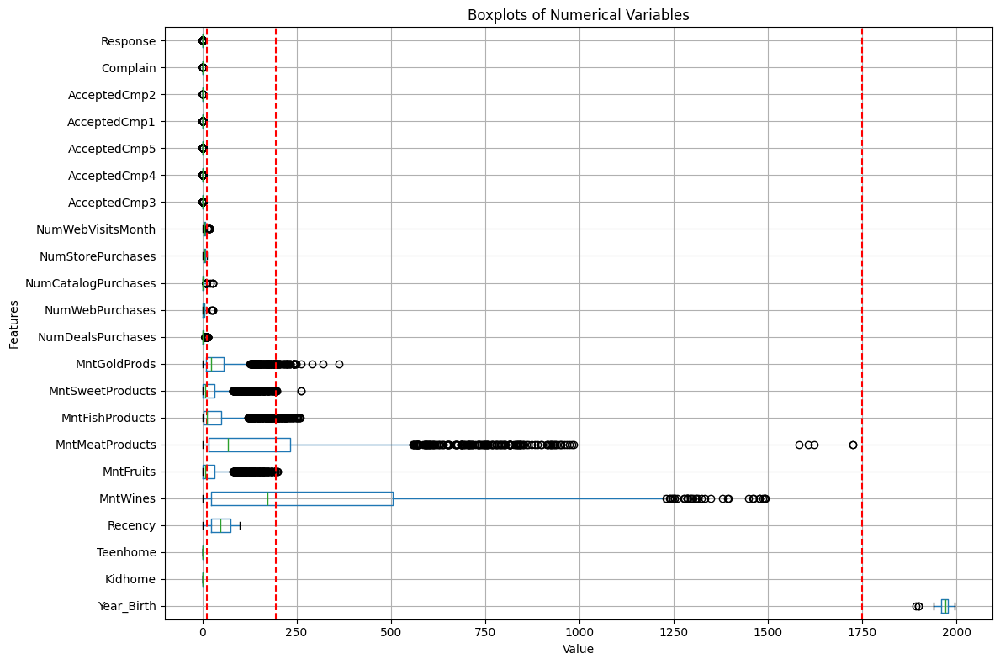

In [ ]:
numeric_cols = df4.select_dtypes(include='number').drop(columns=['Income','ID']) #Creates numeric_cols df for all numeric values. Income is dropped as the max expands the plot out too far to see the other variables. ID is dropped because it is the unique identifier.

# Plot all numeric columns as horizontal boxplots
plt.figure(figsize=(12, 8))
numeric_cols.boxplot(vert=False)
plt.axvline(x=1750, color='red', linestyle='--')#The dashed lines mark the threholds used to separate group variables in the analyses below.
plt.axvline(x=195, color='red', linestyle='--')
plt.axvline(x=12, color='red', linestyle='--')
plt.title("Boxplots of Numerical Variables")
plt.xlabel("Value")
plt.ylabel("Features")
plt.tight_layout()
plt.show()


This set of boxplots shows the spread, central tendency, and outliers for all numeric variables except income. Income was excluded as it expands the chart too far out to see other variables. In this chart, it is difficult to see the plots for all variables at once, so they will be separated out based on their MAX value in the following charts.

-  Mnt Boxplot 195 < MAX < 1750

-  Num & Recency Boxplot 12 < MAX < 195

-  AcceptedCmp, Complain, Response, & Teen/KidHome Boxplot MAX < 12

####Mnt Boxplot: 195 < MAX < 1750

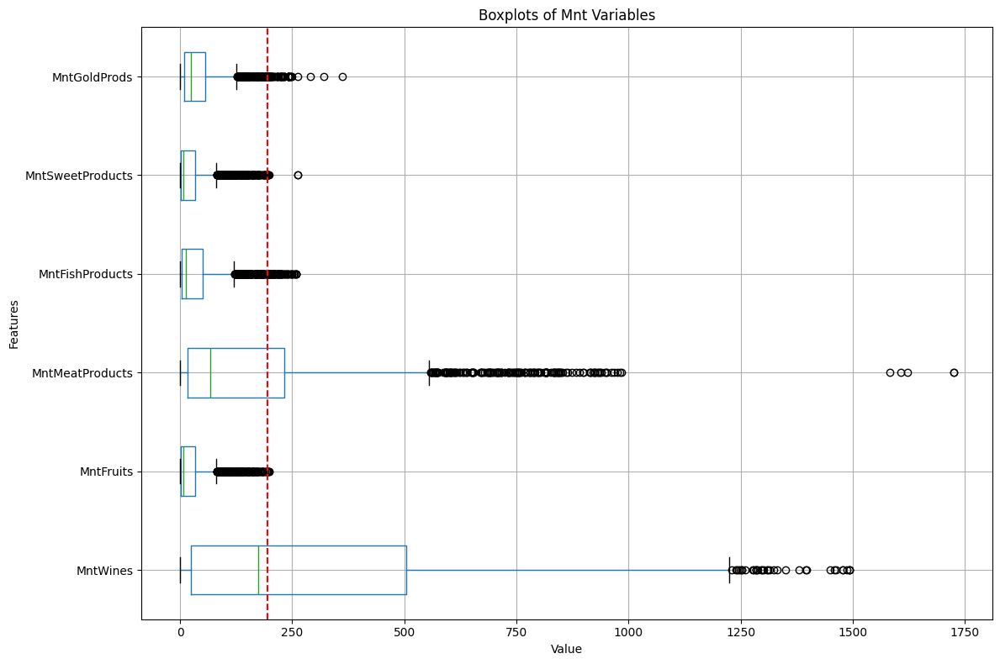

In [ ]:
max_above_195_numeric = numeric_cols.loc[:, (numeric_cols.max() > 195) & (numeric_cols.max() < 1750)]#The thresholds of 195 and 1750 are used in the analysis below to ensure the "Mnt__" variables are grouped together, with MntFruits having the lowest max at 199 and MntMeatProducts having the highest max at 1725.

# Plot max_above_195_numeric as horizontal boxplots
plt.figure(figsize=(12, 8))
max_above_195_numeric.boxplot(vert=False)
plt.axvline(x=195, color='red', linestyle='--')
plt.title("Boxplots of Mnt Variables")
plt.xlabel("Value")
plt.ylabel("Features")
plt.tight_layout()
plt.show()


For the Mnt variables, it is notable that all have at least 10 outliers. This suggests there are some customers that spend a lot more money on these products than others.

The products with the highest value per customer are meats and wines. Meats have a few outliers that extend far outside the IQR, suggesting that those data points are restaurant owners that buy meats for their customers.

The wines also have many outliers, suggesting that there are quite a few customers that spend over >$1250 on wine. This could represent restaurant owners or that those customers are buying very expensive wines.  

Gold, Sweet, Fruits, and Fish products, all having a max > 195. However, those categories generate at most $200 to $300 per customer whereas meat and wine can generate up to $1400 to $1600 per customer. This suggests that meat and wine are the highest source of revenue among these products.

####Num & Recency: Boxplot 12 < MAX < 195

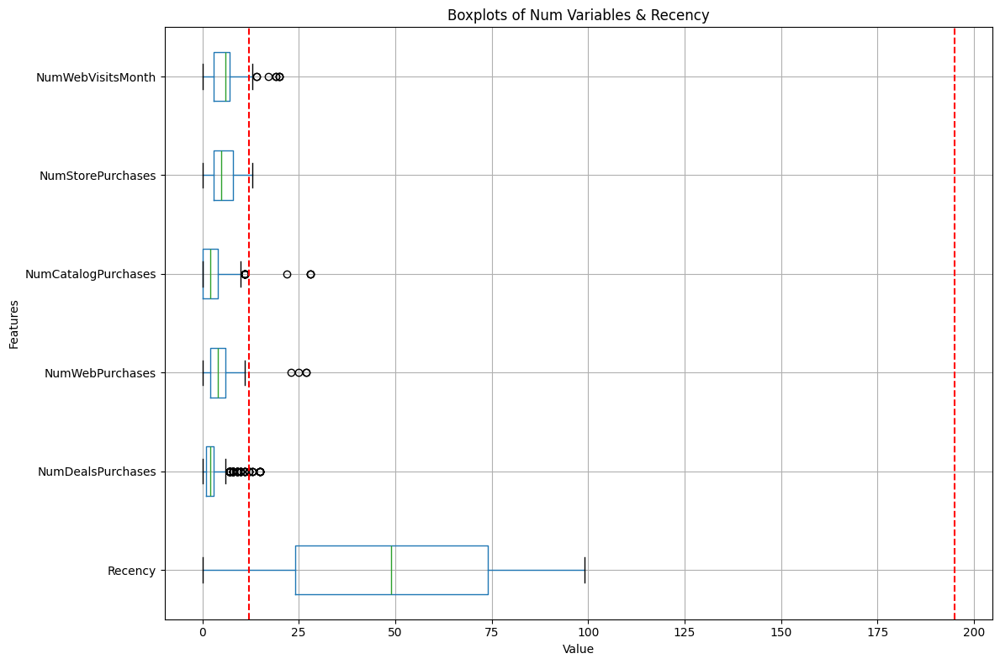

In [ ]:
max_below_195_numeric = numeric_cols.loc[:, (numeric_cols.max() > 12) & (numeric_cols.max() < 195)]#The thresholds of 195 and 12 are used in the analysis below to ensure the "Num__" variables are grouped together, with NumStorePurchases having the lowest max at 13 and NumCatalogPurchases having the highest max at 28.

# Plot max_below_195_numeric columns as horizontal boxplots
plt.figure(figsize=(12, 8))
max_below_195_numeric.boxplot(vert=False)
plt.axvline(x=195, color='red', linestyle='--')
plt.axvline(x=12, color='red', linestyle='--')
plt.title("Boxplots of Num Variables & Recency")
plt.xlabel("Value")
plt.ylabel("Features")
plt.tight_layout()
plt.show()


The Num__Purchases variables tend to center around a value of 5, with the max being catalog purchases at 28. This means that most customers make around 5 purchases per a given variable and make a purchase at most 28 times.

All Num__Purchases variables have outliers except NumStorePurchases, suggesting there are very frequent purchasers in web, deals, and catalog but not necessarily in the store. This is insightful for business decisions to avoid store purchasers when catering toward high-frequency buyers.

NumDealsPurchases has the most outliers out of these categories, suggesting there are many customers that purchase deals frequently when compared to others. This is notable for business decisions surrounding deals and sales.

The NumWebVisitsMonth variable suggests there are at least a few customers that visit the website more than 13 times per month, which is about every other day. Future analysis will determine whether the frequent visitors are also the frequent purchasers.  

Recency spans from 0 to 99, suggesting some customers made a purchase today (or the day the dataset was collected) and some made a purchase at most 99 days ago. The spread looks consistent, suggesting that purchasers follow a normal distribution when returning to purchase more.

####AcceptedCmp, Complain, Response, & Teen/KidHome Boxplot: MAX < 12

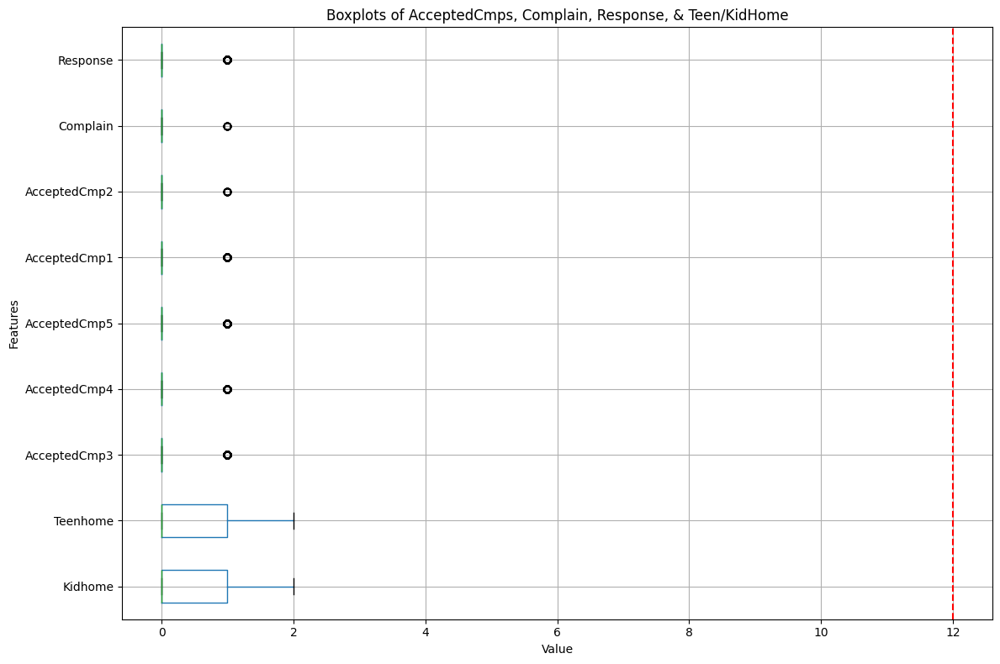

In [ ]:
max_12_numeric = numeric_cols.loc[:, numeric_cols.max() < 12]

# Plotmax_12_numeric columns as horizontal boxplots
plt.figure(figsize=(12, 8))
max_12_numeric.boxplot(vert=False)
plt.title("Boxplots of AcceptedCmps, Complain, Response, & Teen/KidHome")
plt.axvline(x=12, color='red', linestyle='--')
plt.xlabel("Value")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

For Response, Complain, and AcceptedCmp1/2/3/4/5, the full IQR of the customers are at 0, with outliers at 1. This suggests that most customers don't engage with responses, complaints, or campaigns, but a small selection of customers do engage. Further analysis will determine whether it's the same customers engaging with the campaigns, complaints, and responses altogether.

For Teenhome and Kidhome, the median and lower bound are at 0, suggesting at least half of the customers in the dataset don't have a teen and at least half don't have a kid. These variables are collected separately, future analysis to combine the variables will reveal what proprotion of customers are a parent (having *either* a kid *or* a teen). The upper range of customers have 2, with none having more than 2.

####Income Univariate Analysis

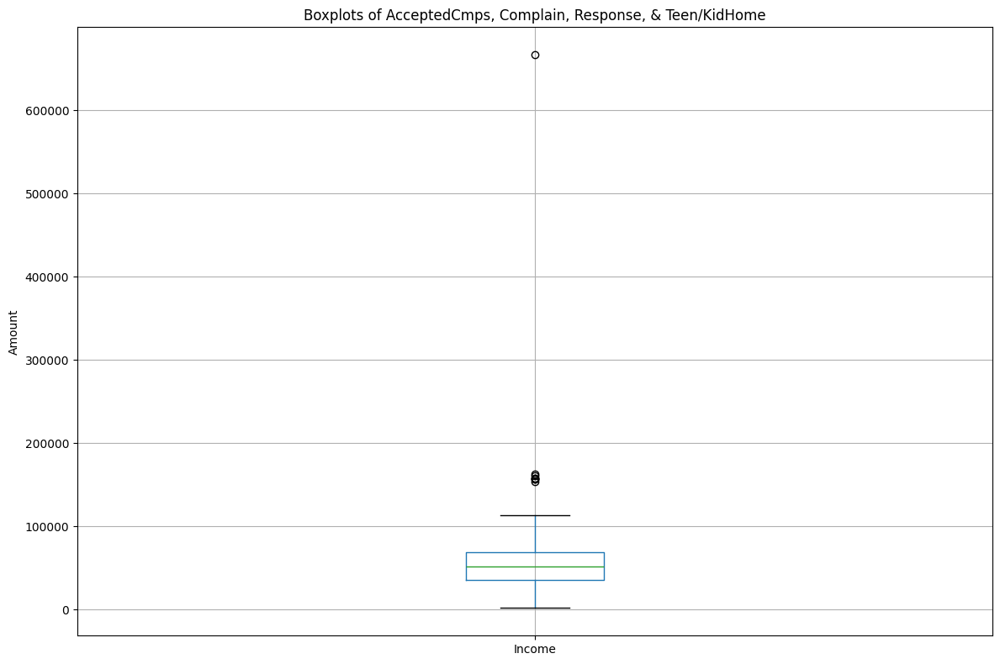

In [ ]:
# Plot Income
plt.figure(figsize=(12, 8))
df4[["Income"]].boxplot()
plt.title("Boxplots of AcceptedCmps, Complain, Response, & Teen/KidHome")
plt.ylabel("Amount")
plt.tight_layout()
plt.show()

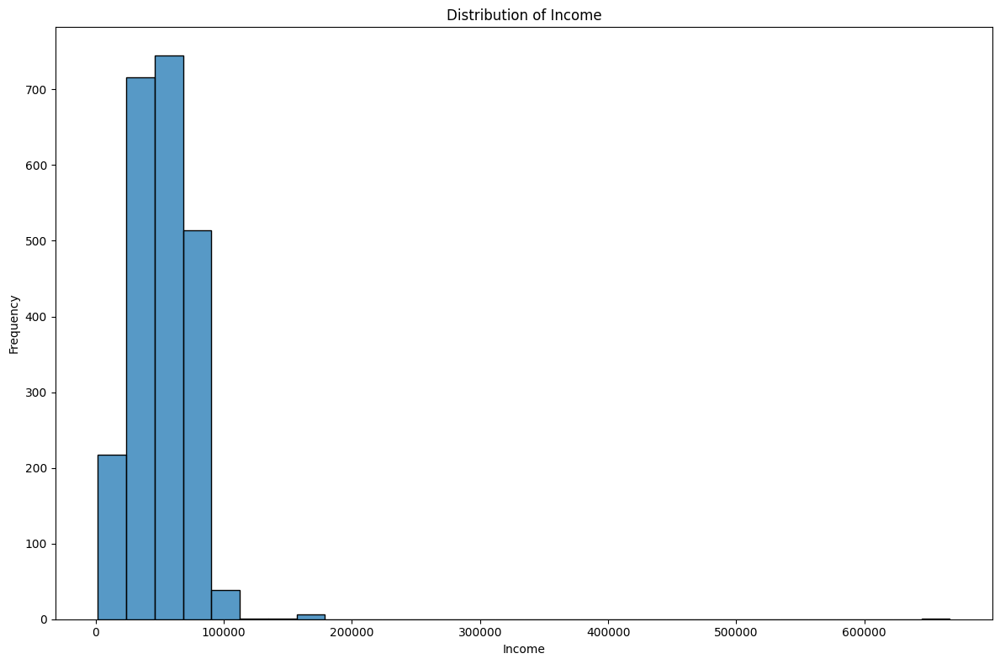

In [ ]:
#Plot histogram of df4["Income"]
plt.figure(figsize=(12, 8))
sns.histplot(df4["Income"], bins=30, kde=False)
plt.title("Distribution of Income")
plt.xlabel("Income")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

**1.How does the distribution of Income variable vary across the dataset?**

Income follows a right skewed distribution with one customer being an extreme outlier, with several other outliers that are less extreme. The bulk of the data is concentrated on the left side between 0 and ~100,000.

**2.The histogram and the box plot are showing some extreme value on the right side of the distribution of the 'Income' feature. Can we consider them as outliers and remove or should we analyze these extreme values?**

Tthe histogram and box plot have extreme value outliers on the right side of the distribution and it is important to treat them since I will be performing clustering algorithms which use Euclidean distance so the outliers will skew the results.



In [ ]:
from scipy.stats import percentileofscore

#Computing Q1 and Q3
q1 = df4["Income"].quantile(0.25)
q3 = df4["Income"].quantile(0.75)
iqr = q3 - q1

#Calculating upper whisker value
upper_whisker = q3 + 1.5 * iqr

#Calculating the percentile of the upper whisker
percentile = percentileofscore(df4["Income"], upper_whisker, kind='weak')

print(f"Upper whisker value: {upper_whisker:.2f}")
print(f"The upper whisker lies at approximately the {percentile:.2f}th percentile.")


Upper whisker value: 117416.25
The upper whisker lies at approximately the 99.64th percentile.


In [ ]:
#Create a d5 with treated Income values
df5 = df4.copy()

#Cap the outliers at the upper whisker
df5["Income"] = df5["Income"].apply(lambda x: min(x, upper_whisker))

#Computing Q1 and Q3
q1 = df5["Income"].quantile(0.25)
q3 = df5["Income"].quantile(0.75)
iqr = q3 - q1

#Calculating upper whisker value
upper_whisker = q3 + 1.5 * iqr

#Calculating the percentile of the upper whisker
percentile = percentileofscore(df5["Income"], upper_whisker, kind='weak')

print(f"Upper whisker value: {upper_whisker:.2f}")
print(f"After treating the outliers, the upper whisker now lies at the {percentile:.2f}th percentile.")


Upper whisker value: 117416.25
After treating the outliers, the upper whisker now lies at the 100.00th percentile.



**3.There are only a few rows with extreme values for the Income variable. Is that enough information to treat (or not to treat) them? At what percentile the upper whisker lies?**

Yes, since there are only a few extreme values in Income, and they can skew the upcoming analysis (e.g., PCA, K-Means), it is reasonable to treat tthem.

The upper whisker lies at approximately the 99.64th percentile. This suggests there is only a small fraction of entries that lie outside the normal range so treating them is unlikely to distort the dataset but can help improve the robustness of clustering and dimensionality reduction techniques.

####Year_Birth Univariate Analysis

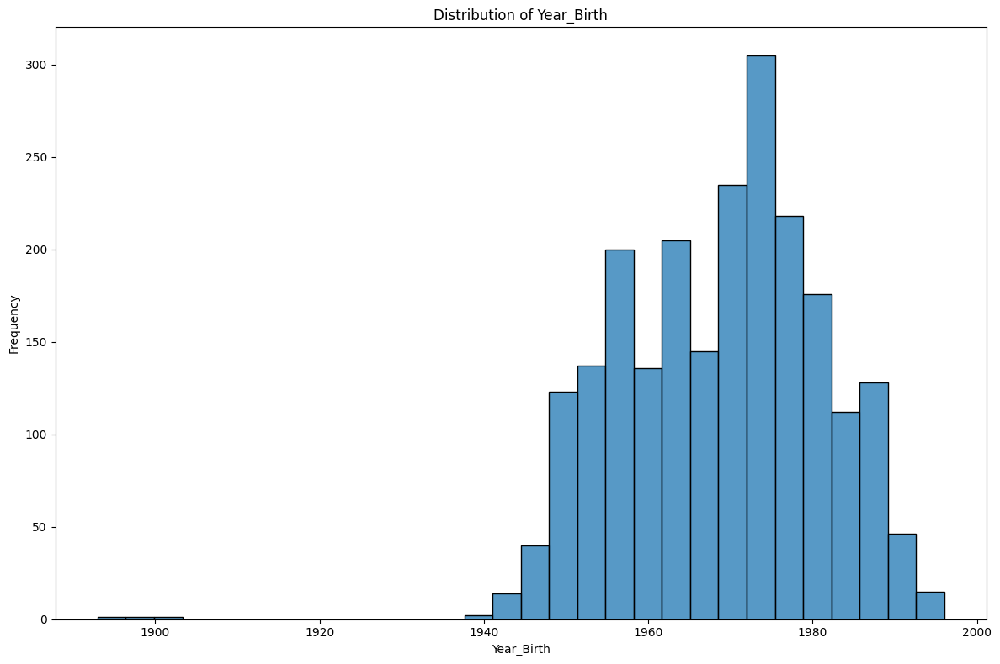

In [ ]:
#Plot histogram of df5["Year_Birth"]
plt.figure(figsize=(12, 8))
sns.histplot(df5["Year_Birth"], bins=30, kde=False)
plt.title("Distribution of Year_Birth")
plt.xlabel("Year_Birth")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

The histogram for Year_Birth shows a left skewed distribution with a few extreme outliers. Since the extreme values are seemingly impossible (before or around the year 1900) they can be treated to normalize the data. Since these are the lowest values, they will be set to the closest low values within normal range.

In [ ]:
#Computing Q1 and Q3
q1 = df5["Year_Birth"].quantile(0.25)
q3 = df5["Year_Birth"].quantile(0.75)
iqr = q3 - q1

#Calculating lower whisker value
lower_whisker = q1 - 1.5 * iqr

#Calculating the percentile of the lower whisker
percentile = percentileofscore(df5["Year_Birth"], lower_whisker, kind='weak')

print(f"Lower whisker value: {lower_whisker:.2f}")
print(f"The lower whisker lies at approximately the {percentile:.2f}th percentile.")

df6 = df5.copy()#Create df6

#Cap the outliers at the lower whisker
df6["Year_Birth"] = df6["Year_Birth"].apply(lambda x: max(x, lower_whisker))

#Computing Q1 and Q3
q1 = df6["Year_Birth"].quantile(0.25)
q3 = df6["Year_Birth"].quantile(0.75)
iqr = q3 - q1

#Calculating lower whisker value
lower_whisker = q3 + 1.5 * iqr

#Calculating the percentile of the lower whisker
percentile = percentileofscore(df6["Year_Birth"], lower_whisker, kind='weak')

print(f"After treatment, the lower whisker value is now at: {lower_whisker:.2f}")
print(f"The lower whisker now lies at the {percentile:.2f}th percentile.")


Lower whisker value: 1932.00
The lower whisker lies at approximately the 0.13th percentile.
After treatment, the lower whisker value is now at: 2004.00
The lower whisker now lies at the 100.00th percentile.


####ID Univariate Analysis

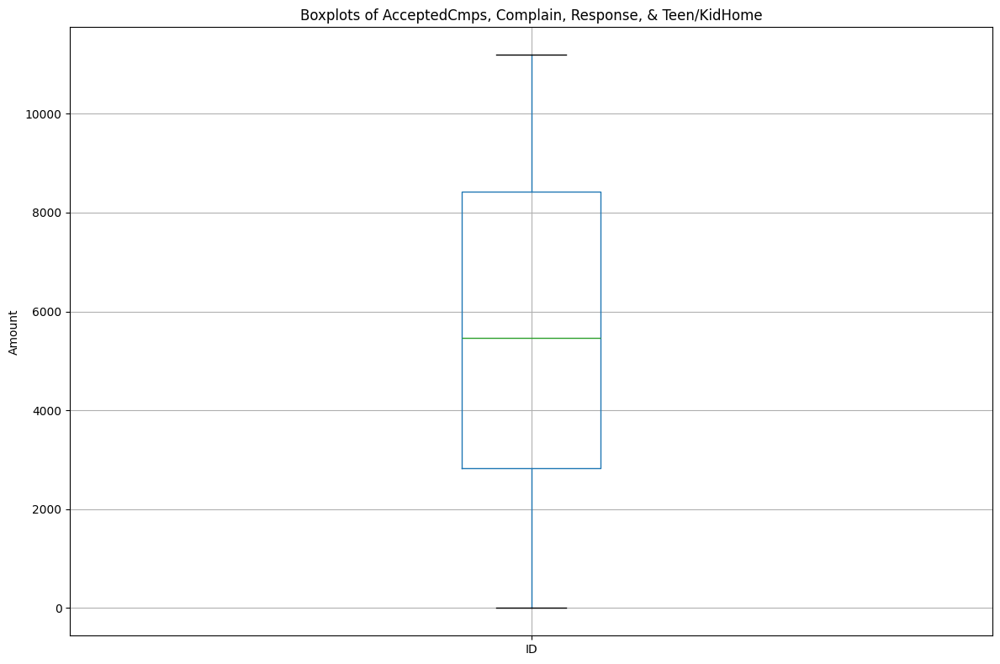

In [ ]:
# Plot ID
plt.figure(figsize=(12, 8))
df4[["ID"]].boxplot()
plt.title("Boxplots of AcceptedCmps, Complain, Response, & Teen/KidHome")
plt.ylabel("Amount")
plt.tight_layout()
plt.show()

Observation: There are no outliers for Plot ID. The distribution is normal.

### **Bivariate Analysis**

 - Analyze different categorical and numerical variables and check how different variables are related to each other.
 - Check the relationship of numerical variables with categorical variables.

####Numeric Variables Heatmap

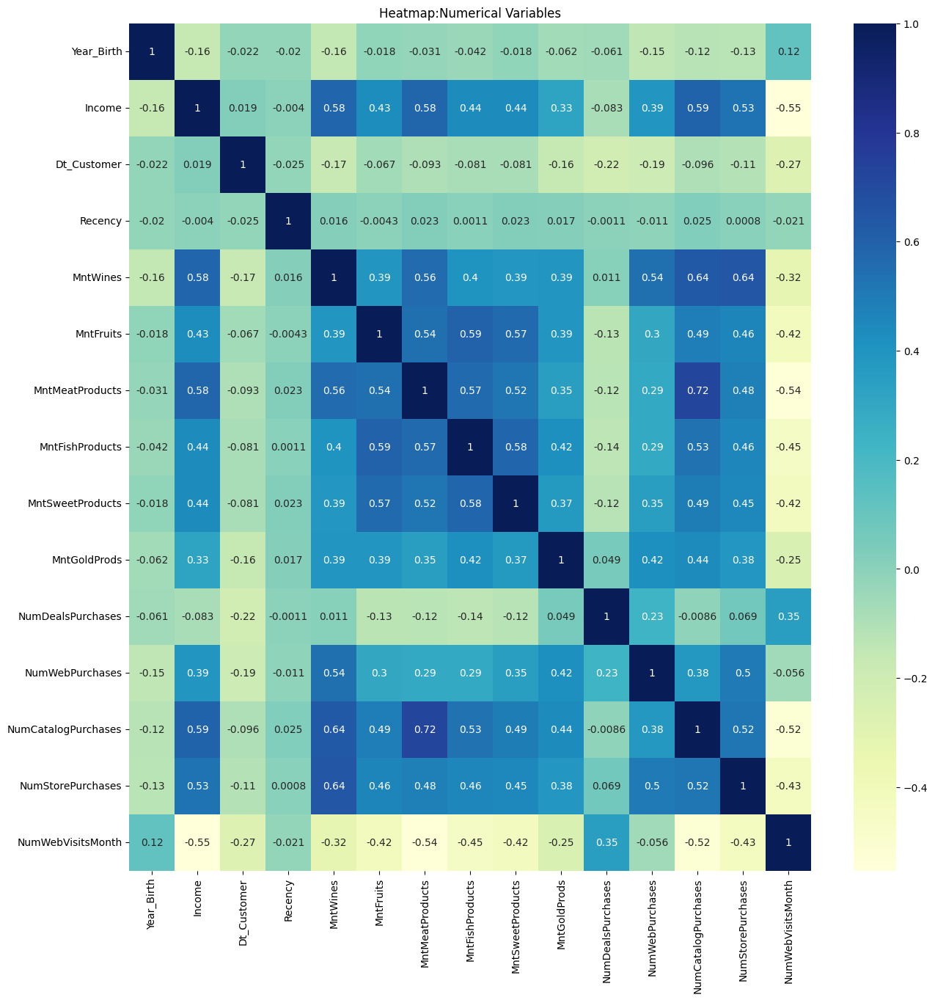

In [ ]:
#The following numeric features will be excluded as they have less than 5 unique values, which will not add value to the correlation metrics: AcceptedCmp, Complain, Response, TeenHome, & KidHome
plt.figure(figsize=(15, 15))
plt.title('Heatmap:Numerical Variables')
sns.heatmap(data=df[['Year_Birth',
'Income',
'Dt_Customer',
'Recency',
'MntWines',
'MntFruits',
'MntMeatProducts',
'MntFishProducts',
'MntSweetProducts',
'MntGoldProds',
'NumDealsPurchases',
'NumWebPurchases',
'NumCatalogPurchases',
'NumStorePurchases',
'NumWebVisitsMonth']].corr(), annot=True, cmap='YlGnBu'); #Initial heatmap analysis to find any correlations between numerical variables
plt.show()

Heatmap Observations:
-  **Year_Birth** shows no correlation (<.2) between all other variables.
-  **Income** has positive moderate correlations with all Mnt__ variables. This suggests that the more people make, the greater the amount they spend on goods in all categories, and vice versa.
-  **Income** also has positive moderate correlations with and all Num__ variables except for NumDealsPurchases and NumWebVisitsMonths. This suggests that high income customers make more web, catalog, and store purchases and vice versa. But, high income customers don't necessarily visit the website more frequently than some other customers. Additionally, it suggests that income is not a good indicator for how frequently customers visit the website or how many deals they purchase.
-  **DT_Customer** only has 2 significant correlations. They are negative, light correlations with NumWebVisitsMonth and NumDealsPurchases. As DT_Customer is a datetime variable, this suggests older (by enrollment date, not age) customers visit the website more and make more deals purchases. One possibility for these correlations is that older users have grown more accustom to the website and learned how to find good deals. This insight is valuable for any future campaigns to retain older users or point new users to existing deals.
-  **Recency** shows no correlations with any other variables. This suggests that the most recent purchase date is not a good indicator for any other variable.  
-  All **Mnt__** variables have positive, moderate correlations with each other and with income. They also have light to strong correlations with the **Num__Purchases** variables. This suggests that, for any given product, if a customer spends more money they are likely to spend more money other products, have more total purchases, and earn more income. Additionally, the **Mnt__** variables have a negative moderate correlation with NumWebVisitsMonth, suggesting that customers who spend more on products visit the website less and vice versa.
-  **MntMeatProducts** and **NumCatalogPurchases** have the strongest correlation (.72) among all numeric variables. This suggests that meat products are often bought as catalog purchases.
-  **NumDealsPurchases** show no correlation with any variable except NumWebPurchases and NumWebVisitsMonth. This suggests there may be a cohort of customers that visit the website frequently to look for deals.
-  The correlations for the other **Num__Purchases** variables were discussed in the above bullet points.
-  **NumWebVisits** has a negate light-to-moderate correlation with Income, all Mnt__ variables, NumCatalogPurchases, and NumStorePurchases. However, NumWebVisits has a positive light correlation with NumDealsPurchases. This suggests that users that visit the website frequently spend less money on goods, have less income, and are more likely to make deal purchases. This could be due to some customers visiting the website frequently only looking for deals due to their lower income.


Thresholds used:
-  .8 to 1 = Very strong correlation
-  .6 to .8 = Strong correlation
-  .4 to .6 = Moderate correlation
-  .2 to .4 = Light correlation
-  0 to .2 = No correlation

####Exploring the Relationship Between Education and Numeric Variables

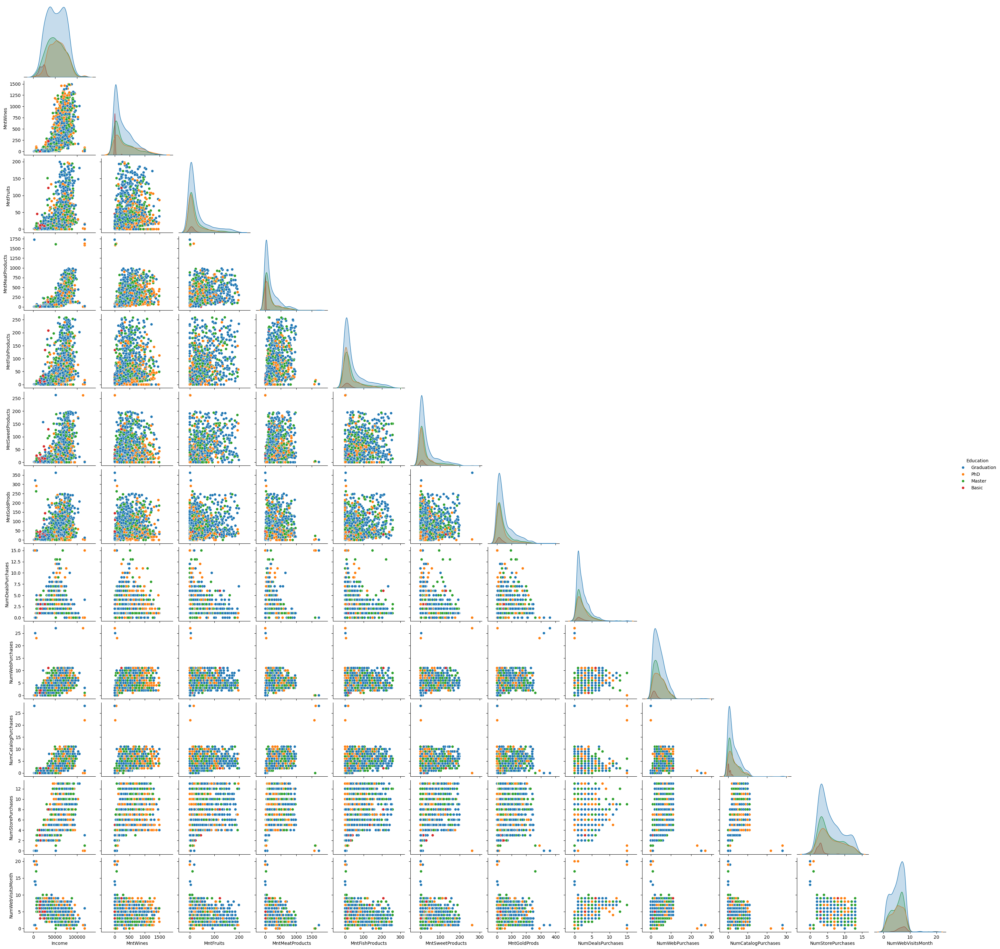

In [ ]:
#The following numeric features will be excluded as they have less than 5 unique values, which will not add value to the paired scatter plots: AcceptedCmp, Complain, Response, TeenHome, & KidHome
#Year_Birth and Recency as they have been identified to have no correlation with any other variables from the heatmap analysis.
numeric_vars=['Income',
'Dt_Customer',
'MntWines',
'MntFruits',
'MntMeatProducts',
'MntFishProducts',
'MntSweetProducts',
'MntGoldProds',
'NumDealsPurchases',
'NumWebPurchases',
'NumCatalogPurchases',
'NumStorePurchases',
'NumWebVisitsMonth']

sns.pairplot(data=df6[numeric_vars + ['Education']], hue = 'Education', corner=True);#Hue set to education to find any correlations between education and any numeric variables
plt.show()

The correlations between numerical variables in the above pairplot echo the findings from the heatmap.

Comparing Education to numerical variable correlations has proven to be too messy to glean any insights visually. Further boxplot analyses will be conducted between Education and numeric variables.



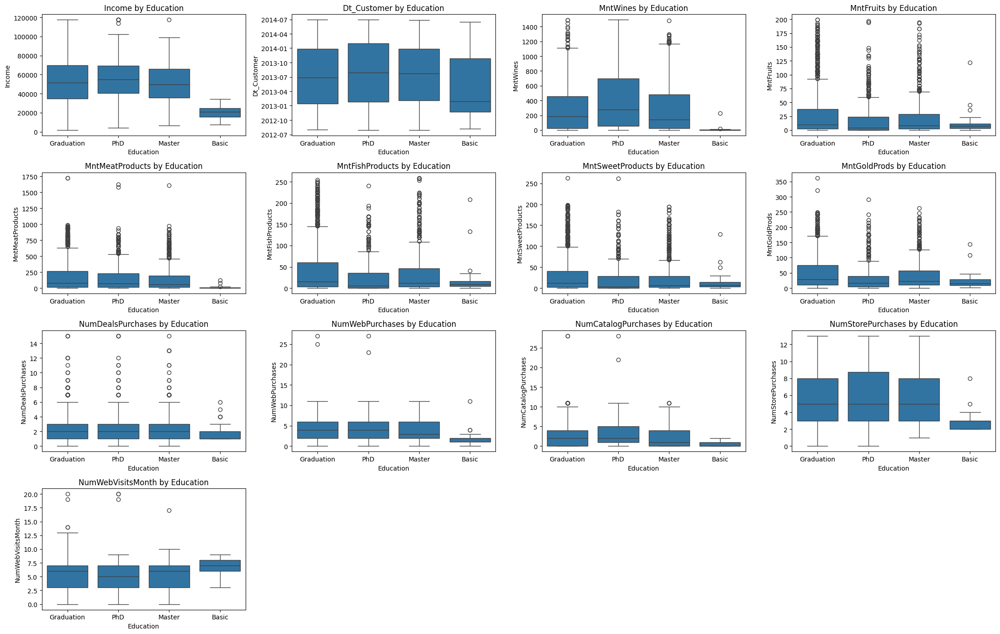

In [ ]:
#Grid size (4 rows x 4 columns)
rows = 4
cols = 4
fig, axes = plt.subplots(rows, cols, figsize=(22, 14))
axes = axes.flatten()

for i, var in enumerate(numeric_vars):
    sns.boxplot(x='Education', y=var, data=df6, ax=axes[i])
    axes[i].set_title(f'{var} by Education')
    axes[i].tick_params(axis='x')

#Hide any unused subplots (in case the grid is bigger than your list)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

"Basic" is generally at the lower range when compared to other Education categories for almost all the numeric values. This suggests Basic customers purchase fewwer items, make less income, and spend less total money. However, it is important to note that the "Basic" category only represents 54 customers which may not yield enough data to accurately compare it to the other categories.

In [ ]:
df6['Education'].value_counts()

,count
Education,
Graduation,1127
Master,573
PhD,486
Basic,54


####Exploring the Relationship Between Marital_Status and Numeric Variables

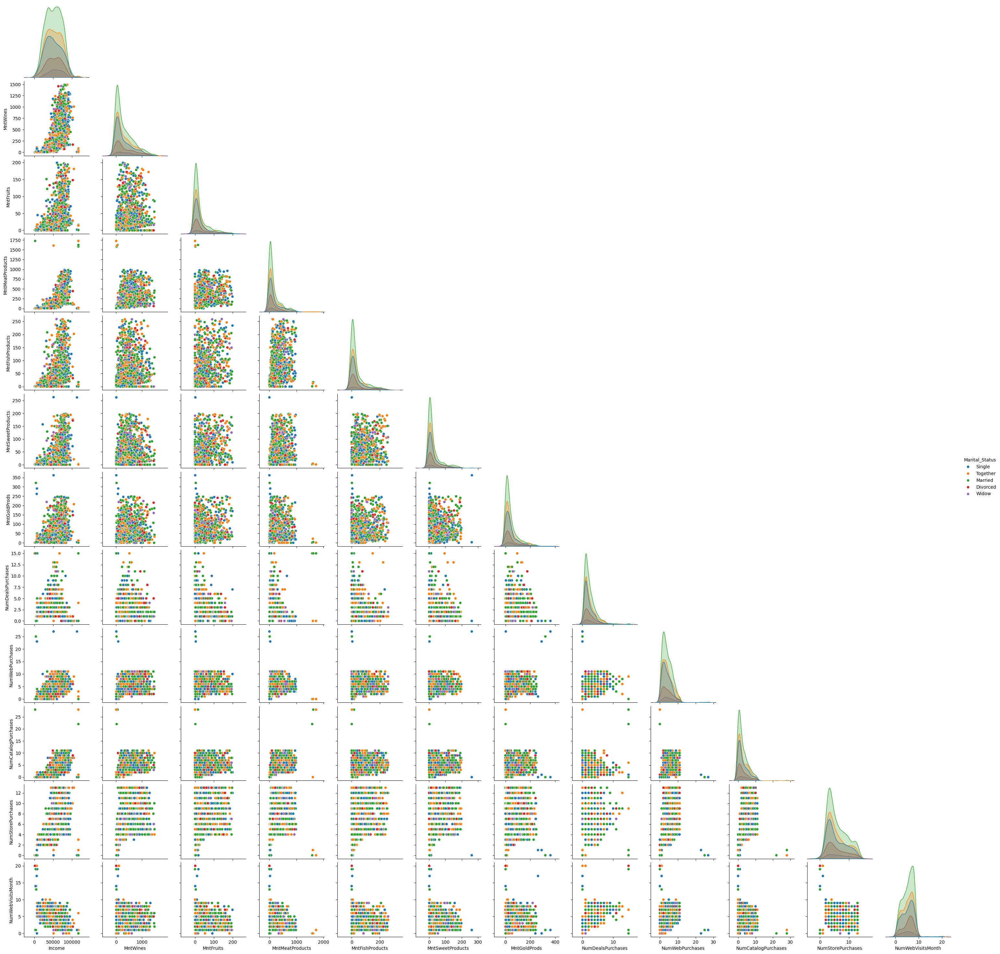

In [ ]:
sns.pairplot(data=df6[numeric_vars + ['Marital_Status']], hue = 'Marital_Status', corner=True);#Hue set to Marital_Status to find any correlations between Marital_Status and any numeric variables
plt.show()

Similar to the findings under the "Education" section, the scatterplots echo findings from the heatmap and the above pairplot is too messy to visually glean any insights for "Marital_Status". Further boxplot analyses will be conducted to assess the relationship between "Marital_Status" and individual numeric variables.  

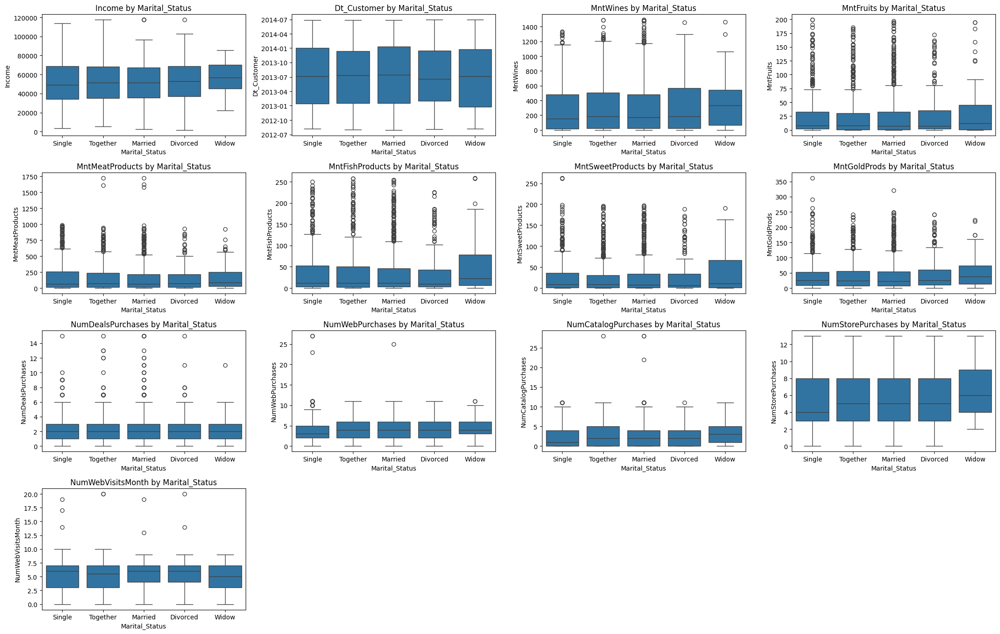

In [ ]:
#Grid size (4 rows x 4 columns)
rows = 4
cols = 4
fig, axes = plt.subplots(rows, cols, figsize=(22, 14))
axes = axes.flatten()

for i, var in enumerate(numeric_vars):
    sns.boxplot(x='Marital_Status', y=var, data=df6, ax=axes[i])
    axes[i].set_title(f'{var} by Marital_Status')
    axes[i].tick_params(axis='x')

#Hide any unused subplots (in case the grid is bigger than your list)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Observations: There are no observable relationships between Marital_Status and any numeric variable.

####Comparing Categorical Variables: Education vs. Marital_Status

In [ ]:
pd.crosstab(df6['Education'], df6['Marital_Status'], normalize='index')#Frequency of combinations between categorical variables


Marital_Status,Divorced,Married,Single,Together,Widow
Education,,,,,
Basic,0.018519,0.370370,0.333333,0.259259,0.018519
Graduation,0.105590,0.384206,0.225377,0.253771,0.031056
Master,0.104712,0.382199,0.198953,0.284468,0.029668
PhD,0.106996,0.395062,0.207819,0.240741,0.049383


Observation: There is a slight trend showing that the proportion of married people increases as education level increases. A Chi-Squared Test will be performed to identify if this trend any others are significant.

In [ ]:
from scipy.stats import chi2_contingency

#Contingency table
contingency = pd.crosstab(df6['Education'], df6['Marital_Status'])

#Chi-square test
chi2, p, dof, expected = chi2_contingency(contingency)

print("Chi-Square Statistic:", chi2)
print("Degrees of Freedom:", dof)
print("P-value:", p)

print("")

print("With a p-value of " + str(round(p,2)) + " it can be concluded that the relationship between Education and Marital Status is not significant.")

Chi-Square Statistic: 15.30641357796166
Degrees of Freedom: 12
P-value: 0.22510575822642637

With a p-value of 0.23 it can be concluded that the relationship between Education and Marital Status is not significant.


#### Comparing Low Cardinality Variables (Kidhome, Teenhome, AcceptedCmp1/2/3/4/5, Complain, and Response)  to  Numeric Variables

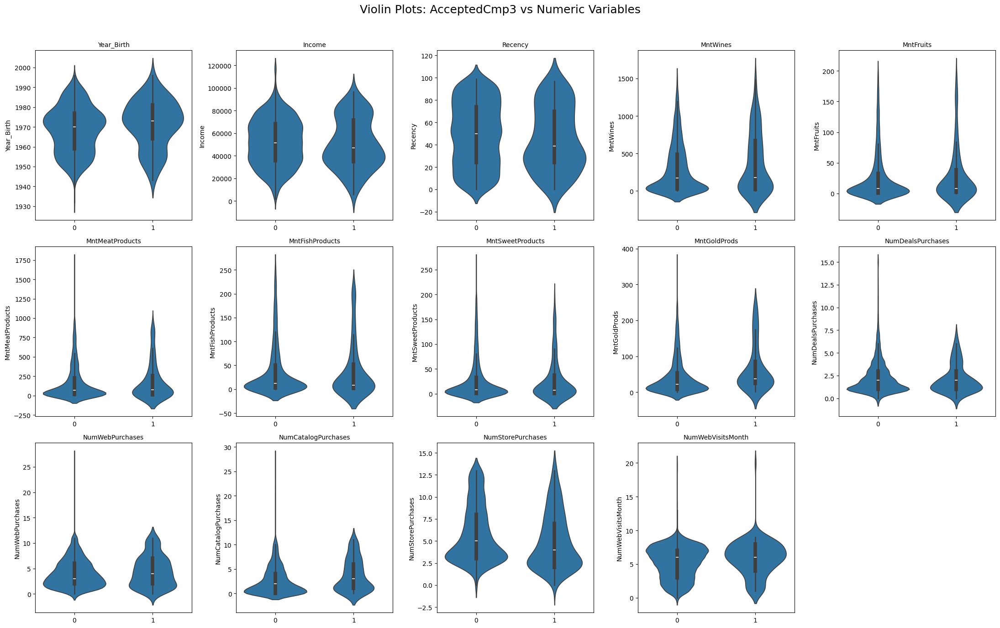

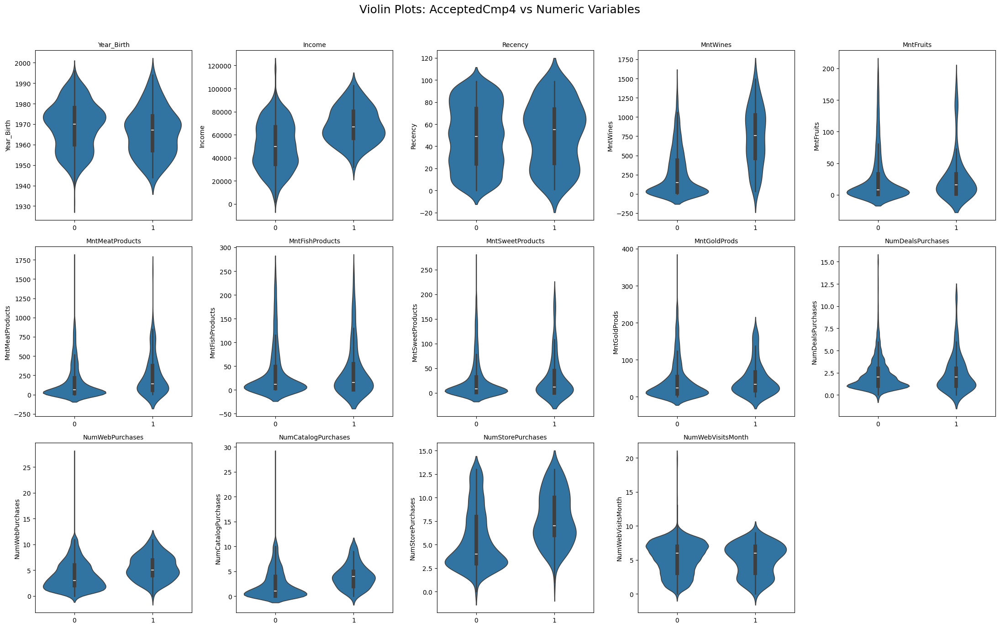

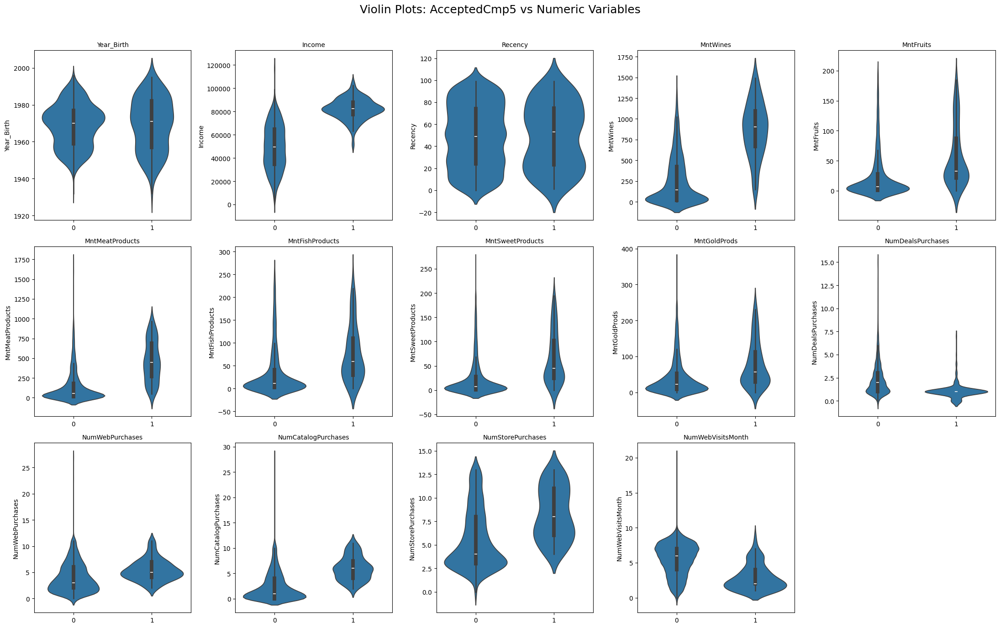

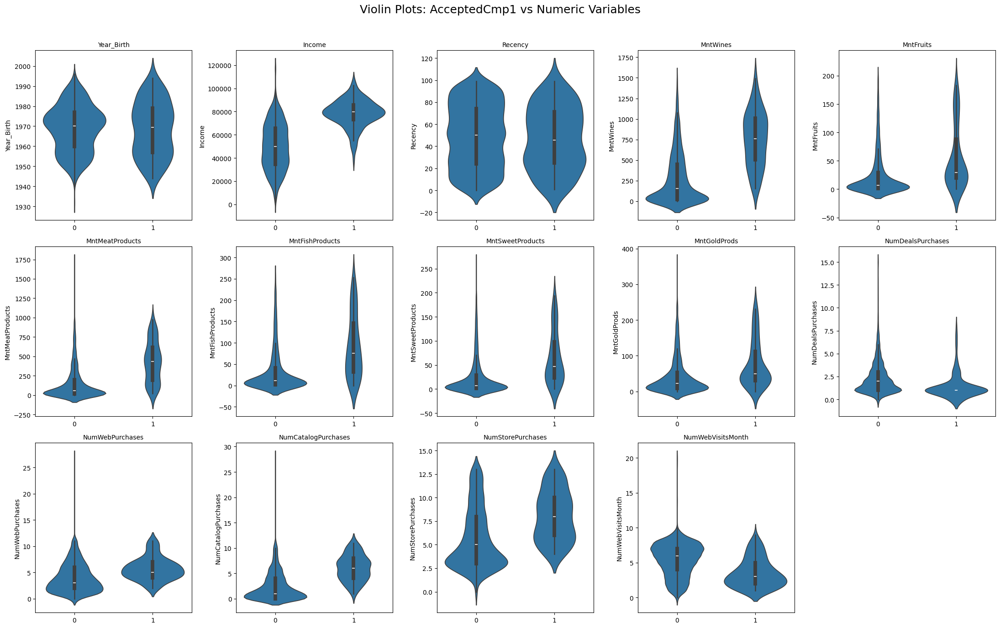

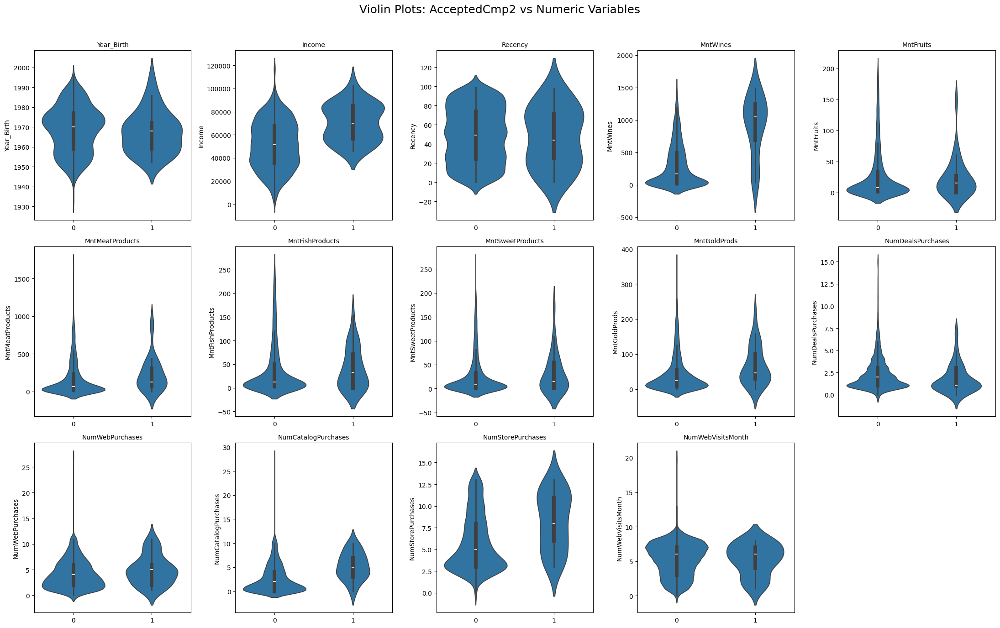

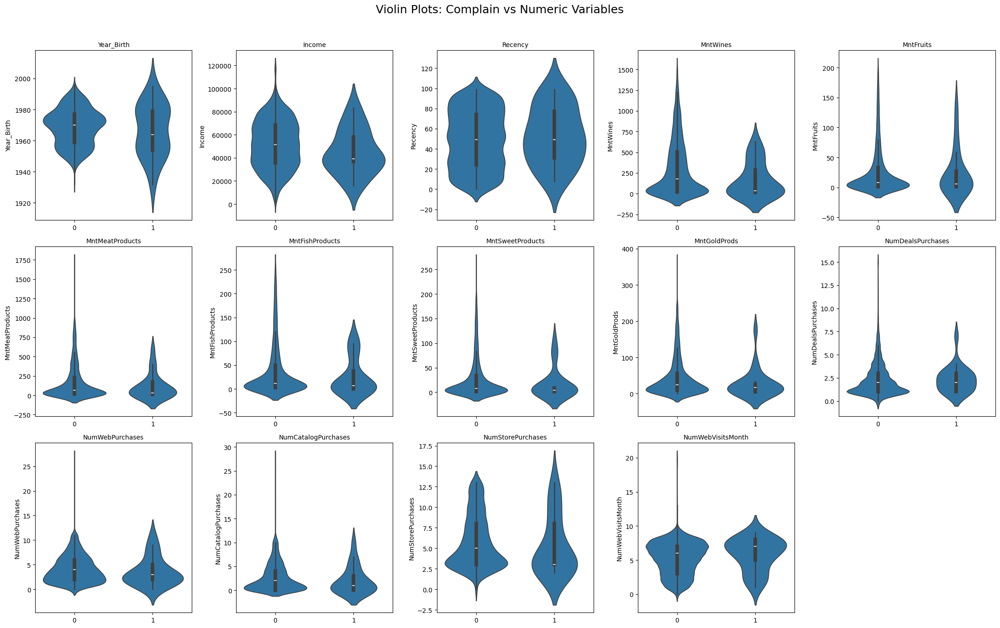

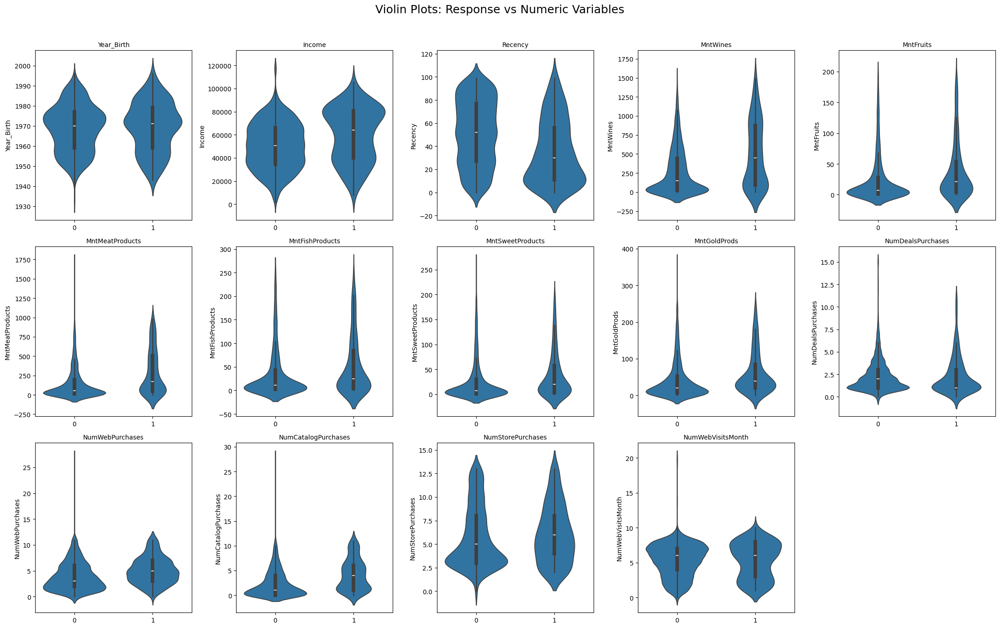

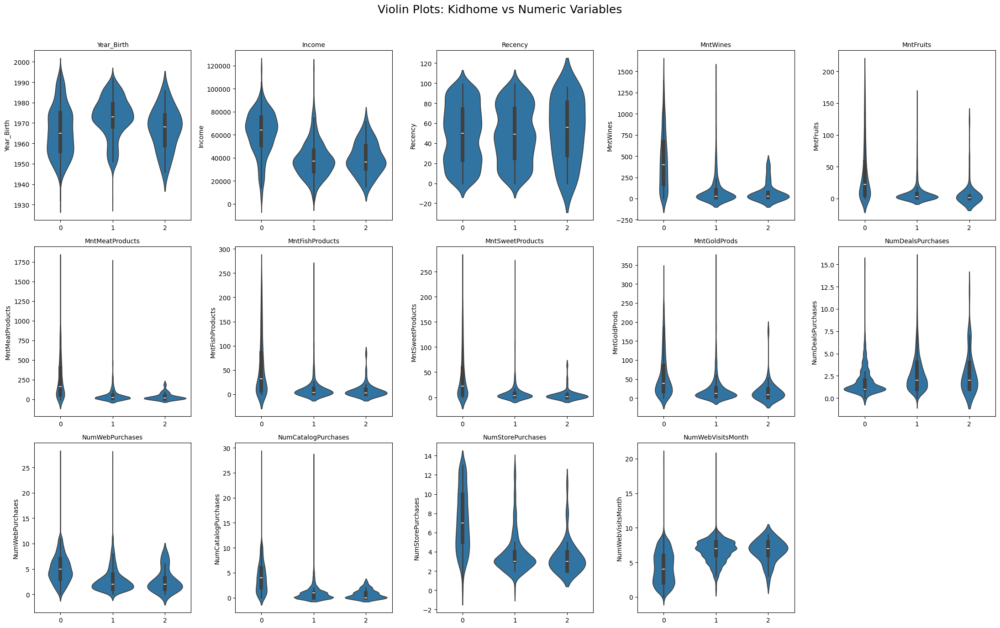

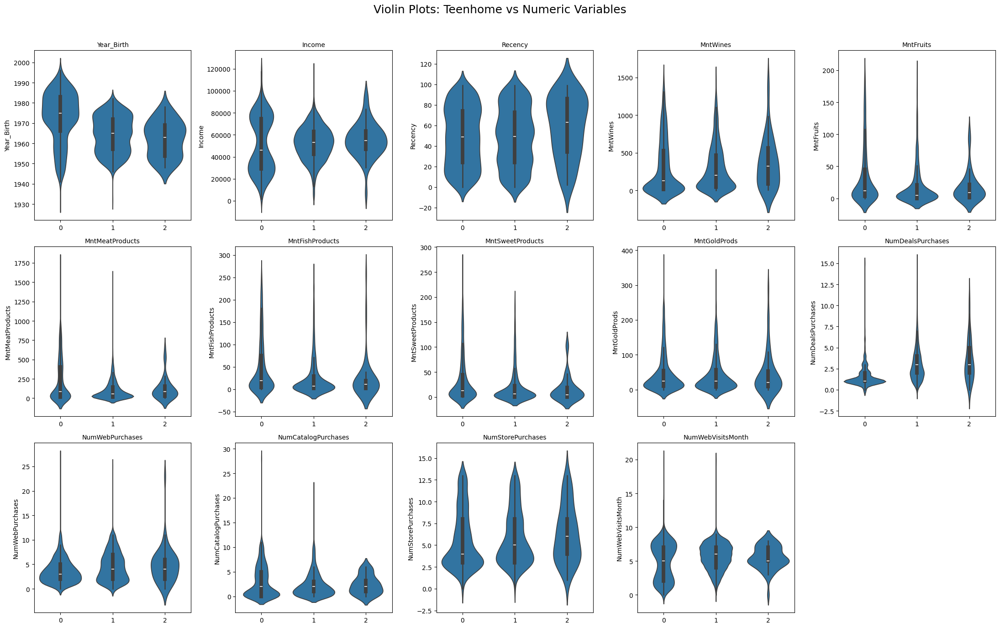

In [ ]:
#Low_Cardinality and numeric variables
low_cardinality_vars = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Kidhome', 'Teenhome']
numeric_vars2 = [
    'Year_Birth', 'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
    'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
    'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth'
] #DT_Customer excluded as it is a datetime variable which is difficult to represent on a violin plot

#Loop through Low_Cardinality variables
for b_var in low_cardinality_vars:
    fig, axes = plt.subplots(3, 5, figsize=(22, 14))
    fig.suptitle(f'Violin Plots: {b_var} vs Numeric Variables', fontsize=18)
    axes = axes.flatten()

    for i, n_var in enumerate(numeric_vars2):
        sns.violinplot(x=b_var, y=n_var, data=df6, ax=axes[i])
        axes[i].set_title(n_var, fontsize=10)
        axes[i].set_xlabel("")
        axes[i].tick_params(axis='x', rotation=0)

    #Hide unused axes (in case less than 15 plots)
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


There are no significant relationships between the "Low_Cardinality" and Numeric variables.

####Comparing Low Cardinality Variables with Eachother

In [ ]:

#Nested loop to go through unique pairs
for i in range(len(low_cardinality_vars)):
    for j in range(i + 1, len(low_cardinality_vars)):
        var1 = low_cardinality_vars[i]
        var2 = low_cardinality_vars[j]

        #Create crosstab
        contingency = pd.crosstab(df6[var1], df6[var2])

        #Run Chi-square test
        chi2, p, dof, expected = chi2_contingency(contingency)

        print(f"{var1} vs {var2}")
        print(f"Chi2 = {chi2:.2f}, p = {p:.4f}, dof = {dof}")
        print("-" * 40)


AcceptedCmp3 vs AcceptedCmp4
Chi2 = 13.02, p = 0.0003, dof = 1
----------------------------------------
AcceptedCmp3 vs AcceptedCmp5
Chi2 = 13.28, p = 0.0003, dof = 1
----------------------------------------
AcceptedCmp3 vs AcceptedCmp1
Chi2 = 18.65, p = 0.0000, dof = 1
----------------------------------------
AcceptedCmp3 vs AcceptedCmp2
Chi2 = 5.95, p = 0.0147, dof = 1
----------------------------------------
AcceptedCmp3 vs Complain
Chi2 = 0.00, p = 1.0000, dof = 1
----------------------------------------
AcceptedCmp3 vs Response
Chi2 = 142.07, p = 0.0000, dof = 1
----------------------------------------
AcceptedCmp3 vs Kidhome
Chi2 = 4.01, p = 0.1348, dof = 2
----------------------------------------
AcceptedCmp3 vs Teenhome
Chi2 = 5.23, p = 0.0732, dof = 2
----------------------------------------
AcceptedCmp4 vs AcceptedCmp5
Chi2 = 206.00, p = 0.0000, dof = 1
----------------------------------------
AcceptedCmp4 vs AcceptedCmp1
Chi2 = 137.59, p = 0.0000, dof = 1
-------------------

Observations:
-  Statistically significant results (p < 0.05) were established from comparing between AcceptedCmp1/2/3/4/5 and Response. This suggests that customers who accepted one campaign were likely to accept another, and even moreso were likely to provide a Response.
-  A significant result was also found between Teenhome and Kidhome, suggesting that customers with 2 kids are more (or less) likely to also have teens at home than expected by random chance.
-  Complain yielded no significant p values between other variables.
-  Despite receiving significant p values it is important to note that these variables are sparse, meaning they have a lot of 0 entries. This could impact the results of the Chi-square test and further analysis needs to be conducted to determine whether these results are conclusive.

####Comparing Low Cardinality Variables with Categorical Variables

In [ ]:
categorical_vars = ["Education", "Marital_Status"]

#Nested loop to go through unique pairs
for var1 in low_cardinality_vars:
    for var2 in categorical_vars:
        contingency = pd.crosstab(df6[var1], df6[var2])
        chi2, p, dof, expected = chi2_contingency(contingency)

        print(f"{var1} vs {var2}")
        print(f"Chi2 = {chi2:.2f}, p = {p:.4f}, dof = {dof}")
        print("-" * 40)

AcceptedCmp3 vs Education
Chi2 = 2.23, p = 0.5258, dof = 3
----------------------------------------
AcceptedCmp3 vs Marital_Status
Chi2 = 2.19, p = 0.7000, dof = 4
----------------------------------------
AcceptedCmp4 vs Education
Chi2 = 6.83, p = 0.0774, dof = 3
----------------------------------------
AcceptedCmp4 vs Marital_Status
Chi2 = 3.81, p = 0.4328, dof = 4
----------------------------------------
AcceptedCmp5 vs Education
Chi2 = 5.20, p = 0.1575, dof = 3
----------------------------------------
AcceptedCmp5 vs Marital_Status
Chi2 = 2.68, p = 0.6130, dof = 4
----------------------------------------
AcceptedCmp1 vs Education
Chi2 = 5.79, p = 0.1225, dof = 3
----------------------------------------
AcceptedCmp1 vs Marital_Status
Chi2 = 2.50, p = 0.6453, dof = 4
----------------------------------------
AcceptedCmp2 vs Education
Chi2 = 5.73, p = 0.1257, dof = 3
----------------------------------------
AcceptedCmp2 vs Marital_Status
Chi2 = 6.51, p = 0.1644, dof = 4
----------------

The following comparisons yielded a statistically significant result (p < .05)
1.   Response vs Education
2.   Response vs Marital_Status
3.   Kidhome vs Education
4.   Teenhome vs Education
5.   Teenhome vs Marital_Status

-  These results suggest people of a certain education or marital status are more likely to respond.
-  The results also indicate that customers of specific education or marital status categories are more likely to have kids or teens.

-  Similar to the previous Chi-square analysis, the results presented here are not conclusive and require further investigation to determine statistically significant relationships.

### **Feature Engineering and Data Processing**

In this section, we will first prepare our dataset for analysis.
- Imputing missing values

This was completed in the "Data Overview" section.

**Think About It:**

- Can we extract the age of each customer and create a new feature?
- Can we find the total kids and teens in the home?
- Can we find out how many members each family has?
- Can we find the total amount spent by the customers on various products?
- Can we find out how long the customer has been with the company?
- Can we find out how many offers the customers have accepted?
- Can we find out amount spent per purchase?



#### Can we extract the age of each customer and create a new feature?

In [ ]:
df6["Dt_Customer"].max()#Identifying the most recent date a customer was added to be used as the date the dataset was pulled

Timestamp('2014-06-29 00:00:00')

In [ ]:
df6["Age"] = 2014 - df6["Year_Birth"]#Setting "Age" to 2014 - Year_Birth
df6.head(1)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age
0,5524,1957.0,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,4,7,0,0,0,0,0,0,1,57.0


####Can we find the total kids and teens in the home?
Can we find out how many members each family has?

In [ ]:
df6["Marital_Status" ].unique() #Displaying the unique Marital_Status values

array(['Single', 'Together', 'Married', 'Divorced', 'Widow'], dtype=object)

In [ ]:
df6["Total_Kids_Teen"] = df6["Kidhome"] + df6["Teenhome"]#Creates Total_Kids_Teen for total kids and teens in a home

parent_map = {#Creating a map dict to assign number of adults per Marital_Status
    'Single': 1,
    'Together': 2,
    'Married': 2,
    'Divorced': 1,
    'Widow': 1
}

df6["Total_Parents"] = df6["Marital_Status"].map(parent_map) #Assigning map to Total_Parents

df6["Family_Size"] = df6["Total_Kids_Teen"] + df6["Total_Parents"] #Calculating family size

df6.head(1)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Total_Kids_Teen,Total_Parents,Family_Size
0,5524,1957.0,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,0,1,57.0,0,1,1


####Can we find the total amount spent by the customers on various products?


In [ ]:
df6["TotalSpent"] = df6["MntWines"] + df6["MntFruits"] + df6["MntMeatProducts"] + df6["MntFishProducts"] + df6["MntSweetProducts"] + df6["MntGoldProds"] #Calculating total spend as the sum of all 6 product categories
df6.head(1)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Total_Kids_Teen,Total_Parents,Family_Size,TotalSpent
0,5524,1957.0,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,1,57.0,0,1,1,1617


####Can we find out how long the customer has been with the company?


In [ ]:
df6["Time_Spent_Days"] = (df6["Dt_Customer"].max() - df6["Dt_Customer"]).dt.days#Calculates the time the customer spent with the company based on the max DT_Customer date (which represents the date the dataset was pulled) minus the DT_Customer date of that specific customer
df6.head(1)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Total_Kids_Teen,Total_Parents,Family_Size,TotalSpent,Time_Spent_Days
0,5524,1957.0,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,1,57.0,0,1,1,1617,663


####Can we find out how many offers the customers have accepted?


In [ ]:
df6["Total_Accepted_Cmp"] = df6[["AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5"]].sum(axis=1)#Sums total accepted offers
df6.head(1)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp2,Complain,Response,Age,Total_Kids_Teen,Total_Parents,Family_Size,TotalSpent,Time_Spent_Days,Total_Accepted_Cmp
0,5524,1957.0,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,1,57.0,0,1,1,1617,663,0


####Can we find out amount spent per purchase?

In [ ]:
df6["TotalNumPurchases"] = df6["NumWebPurchases"] + df6["NumCatalogPurchases"] + df6["NumStorePurchases"] +df6["NumDealsPurchases"] #Sums total purchases per customer. NumDealsPurchases is included since there are some customers with NumDealsPurchases >0 where the other purchases = 0 indicating that NumDealsPurchases is not already accounted for in the other purchasing categories.
df6.loc[df6["TotalNumPurchases"] == 0, "TotalNumPurchases"] = 1 #There are a few customers that have zero total purchases across all categories, but still have an amount spent. This indicates missing values and those customers are set to the min possible TotalNumPurchases at 1.
df6["AvgSpentPerPurchase"] = round(df6["TotalSpent"] / df6["TotalNumPurchases"],2)#Calculates the average amount spent per purchase

df6.head(1)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Response,Age,Total_Kids_Teen,Total_Parents,Family_Size,TotalSpent,Time_Spent_Days,Total_Accepted_Cmp,TotalNumPurchases,AvgSpentPerPurchase
0,5524,1957.0,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,1,57.0,0,1,1,1617,663,0,25,64.68


## **Important Insights from EDA and Data Preprocessing**

**What are the the most important observations and insights from the data based on the EDA and Data Preprocessing performed?**

Numeric Variables:
*   There are moderate correlations between numeric variables. Notably Income, Mtn__ variables, and Num___ variables have insightful relationships between eachother.
*   Year_Birth and Recency have no correlations with other numeric variables.

Categorical Variables:
*   No meaningful relationships between categorical and numeric variables were identified.
*   No meaningful relationships between categorical variables were identified.

Low Cardinality Variables:
*   No meaningful relationships were identified between numeric variables and low cardinality variables.
*   There are several significant relationships between low cardinality variables that should be taken with a grain of salt due to the scarcity (frequent 0 value) makeup of the data.
*   There are several significant relationships between low cardinality variables and Categorical Variables that should be taken with a grain of salt due to the scarcity (frequent 0 value) makeup of the data.






## **Data Preparation for Segmentation**

- The decision about which variables to use for clustering is a critically important decision that will have a big impact on the clustering solution. So we need to think carefully about the variables we will choose for clustering. Clearly, this is a step where a lot of contextual knowledge, creativity, and experimentation/iterations are needed.
- Moreover, we often use only a few of the data attributes for segmentation (the segmentation attributes) and use some of the remaining ones (the profiling attributes) only to profile the clusters. For example, in market research and market segmentation, we can use behavioral data for segmentation (to segment the customers based on their behavior like amount spent, units bought, etc.), and then use both demographic as well as behavioral data for profiling the segments found.
- Plot the correlation plot after we've removed the irrelevant variables
- Scale the Data

####Identifying Critical Features

In [ ]:
print(df6.columns)#Print column headers

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Total_Kids_Teen',
       'Total_Parents', 'Family_Size', 'TotalSpent', 'Time_Spent_Days',
       'Total_Accepted_Cmp', 'TotalNumPurchases', 'AvgSpentPerPurchase'],
      dtype='object')


In [ ]:
features = ['Income', 'NumWebVisitsMonth',
       'Response', 'Age', 'Family_Size',  'TotalSpent',
       'TotalNumPurchases', 'AvgSpentPerPurchase', 'Total_Accepted_Cmp'] #These features have been extracted from the full set of columns in df6 as they represent most of the meaningful variability in the dataset. Variables that are redundant or that have little to no correlations with other variables were excluded from the list of features.

####Plot the correlation plot after we've removed the irrelevant variables

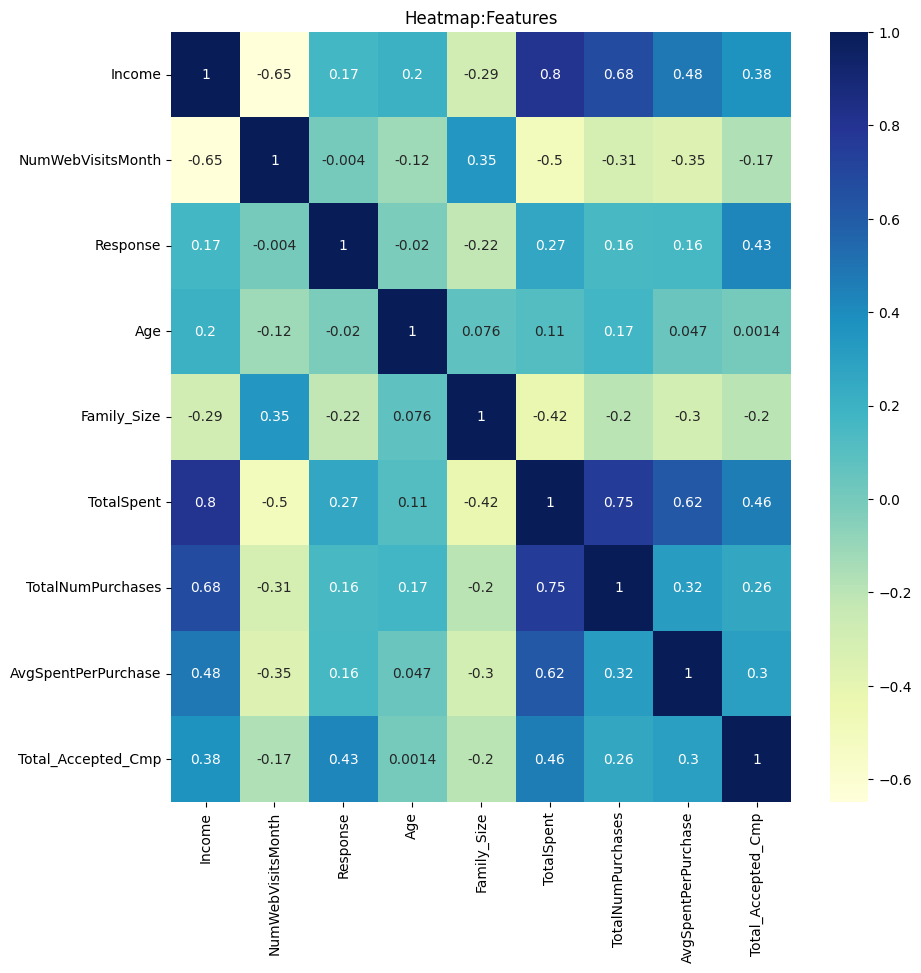

In [ ]:
plt.figure(figsize=(10, 10))
plt.title('Heatmap:Features')
sns.heatmap(data=df6[features].corr(), annot=True, cmap='YlGnBu'); #Heatmap to calculate correlations between critical features
plt.show()

####Scale the Data

In [ ]:
df6["AvgSpentPerPurchase"].max()

1679.0

In [ ]:
df6[features].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Income               2240 non-null   float64
 1   NumWebVisitsMonth    2240 non-null   int64  
 2   Response             2240 non-null   int64  
 3   Age                  2240 non-null   float64
 4   Family_Size          2240 non-null   int64  
 5   TotalSpent           2240 non-null   int64  
 6   TotalNumPurchases    2240 non-null   int64  
 7   AvgSpentPerPurchase  2240 non-null   float64
 8   Total_Accepted_Cmp   2240 non-null   int64  
dtypes: float64(3), int64(6)
memory usage: 157.6 KB


In [ ]:
X = df6[features] #Creating X for easier scaling

#Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

## **Applying T-SNE and PCA to the data to visualize the data distributed in 2 dimensions**

### **Applying T-SNE**

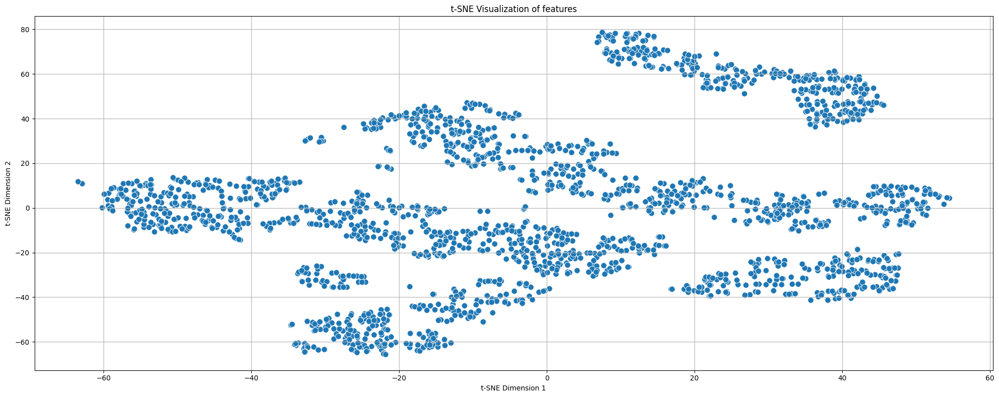

In [ ]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

#Run t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

#DataFrame for plotting
tsne_df = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])

#Plot t-SNE results
plt.figure(figsize=(20, 8))
sns.scatterplot(
    data=tsne_df,
    x='TSNE1', y='TSNE2',
    s=70
#    color='lightblue'
#   color='#d3d3d3'
)
plt.title('t-SNE Visualization of features')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
#plt.xlim(-120, 120)
plt.grid(True)
plt.tight_layout()
plt.show()

**Observation and Insights:**



*   The plot successfully shows visually distinct clusters. t-SNE has mapped groups of samples that are similar to each other based on their features.
*   On the top-right side of the plot there is a medium-sized segregated cluster which stands out from the rest. There is another more distinct cluster at the bottom-right.
*   The central region appears to be densely packed and has less clear separation between clusters indicating that the boundaries between those clusters are less distinct.
*   Further analysis will determine how different features play into the separation of the clusters.

### **Applying PCA**

**Think about it:**
- Should we apply clustering algorithms on the current data or should we apply PCA on the data before applying clustering algorithms? How would this help?

While it’s possible to apply clustering algorithms directly to the original dataset to gain an initial understanding of potential groupings, this approach can be problematic in high-dimensional settings. Firstly, clustering algorithms can be sensitive to noise and irrelevant features. Applying PCA beforehand helps reduce dimensionality, which improves computational efficiency and eliminates redundant or less informative variables.

Secondly, PCA helps highlight the underlying structure of the data, allowing clustering algorithms to more clearly define boundaries between groups. As a result, clusters tend to be more meaningful and better separated when PCA is applied before clustering.

In [ ]:
#Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

#Create a DataFrame with explained variance
explained_variance = pd.DataFrame({
    'Principal Component': [f'PC{i+1}' for i in range(len(pca.explained_variance_ratio_))],
    'Explained Variance Ratio': pca.explained_variance_ratio_,
    'Cumulative Explained Variance': np.cumsum(pca.explained_variance_ratio_)
})

#Display the explained variance
explained_variance

,Principal Component,Explained Variance Ratio,Cumulative Explained Variance
0,PC1,0.418321,0.418321
1,PC2,0.144859,0.563180
2,PC3,0.116082,0.679262
3,PC4,0.086880,0.766143
4,PC5,0.074666,0.840808
5,PC6,0.069444,0.910252
6,PC7,0.055980,0.966232
7,PC8,0.020647,0.986879
8,PC9,0.013121,1.000000


**Observation and Insights:**

PC1 explains 34.4% of the variance of the features in the dataset.

The first 7 principal components explain 96.6% of the variance of the data. Since there were only 9 features included in this PCA, the high number of principal components required to explain the majority of the data suggests that the data is fairly spread out across dimensions. This could be because no single feature accounts for the variance of the dataset, because there is low redundancy (each feature contributes unique information), and/or because the features are not highly correlated with eachother.



In [ ]:
#Get the PCA component coefficients
loadings = pd.DataFrame(pca.components_[:7], columns=features, index=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7'])
loadings.T.round(2)  #Transpose to see features as rows, and round 2

def highlight_strong_loadings(val):
    if val > 0.2:
        return 'color: green'
    elif val < -0.2:
        return 'color: red'
    else:
        return ''

# Apply to loadings
styled_loadings = loadings.T.round(2).style.applymap(highlight_strong_loadings)
styled_loadings


<ipython-input-57-b5940e353f88>:14: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_loadings = loadings.T.round(2).style.applymap(highlight_strong_loadings)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7
Income,0.450000,-0.210000,0.030000,-0.110000,-0.090000,-0.220000,0.110000
NumWebVisitsMonth,-0.330000,0.290000,0.330000,-0.270000,-0.040000,0.590000,-0.310000
Response,0.180000,0.620000,0.340000,0.250000,-0.190000,0.040000,0.610000
Age,0.090000,-0.450000,0.610000,0.600000,0.120000,0.160000,-0.130000
Family_Size,-0.260000,-0.220000,0.500000,-0.550000,0.300000,-0.310000,0.360000
TotalSpent,0.480000,-0.020000,0.010000,-0.180000,-0.050000,0.160000,-0.060000
TotalNumPurchases,0.380000,-0.180000,0.210000,-0.390000,-0.470000,0.250000,-0.070000
AvgSpentPerPurchase,0.340000,0.040000,-0.160000,-0.080000,0.750000,0.440000,0.180000
Total_Accepted_Cmp,0.280000,0.450000,0.290000,-0.050000,0.260000,-0.450000,-0.580000


**Observation and Insights:**

*   PC1, as the largest representation of variance, represents overall customer value or purchasing power. Customers with high PC1 scores have more money, spend more money, spend frequently, and accept more campaign offers. They also tend to have a smaller family size and visit the website less frequently.
*   PC2, as the second largest and orthogonal to PC1, displays a contrast between older, less responsive customers vs. younger, more responsive ones.
*   PC3 reflects demographics and online activity where older customers with larger families are more responsive and visit the website more frequently.
*   In the next section, we observed that the majority of variance is captured in the first 3 principal components (PC1–PC3), and the analysis is focused on those components.



## **K-Means**

**Think About It:**

- How do we determine the optimal K value from the elbow curve?

To determine the optimal K value from the elbow curve, we plot the sum of squares (SSE) against the number of clusters.


- Which metric can be used to determine the final K value?

The final K value can be determined by visually identifying an "elbow" in the chart which would represent a cluster that does not significantly reduce the SSE further.

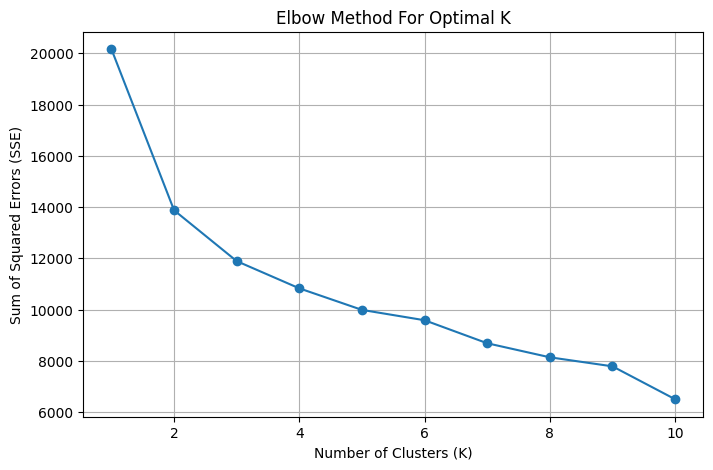

In [ ]:
sse = {} #Initialize a dictionary to store the Sum of Squared Error (SSE) for each K

#Run for a range of Ks and store SSE for each run
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    sse[k] = kmeans.inertia_

#Plot the SSE vs K and plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Sum of Squared Errors (SSE)")
plt.title("Elbow Method For Optimal K")
plt.grid(True)
plt.show()

### **Applying K-Means on the PCA data and visualize the clusters**

In [ ]:
#Assign cluster labels
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(X_pca)

#Create a DataFrame with PCA values and cluster labels
X_pca_df_kmeans = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])
X_pca_df_kmeans['KMeans_Cluster'] = kmeans_labels

#Print summary statistics for each K-Means cluster
print(X_pca_df_kmeans.groupby('KMeans_Cluster').describe())


                   PC1                                                    \
                 count      mean       std       min       25%       50%   
KMeans_Cluster                                                             
0               1172.0 -1.561964  0.677964 -4.219192 -2.068167 -1.635646   
1                258.0  3.217973  1.300465  0.455055  2.463539  3.290623   
2                810.0  1.235043  0.926150 -0.711733  0.494788  1.163137   

                                        PC2            ...       PC8  \
                     75%        max   count      mean  ...       75%   
KMeans_Cluster                                         ...             
0              -1.028894   0.457402  1172.0  0.217071  ...  0.264998   
1               3.983002  13.782667   258.0  1.593611  ...  0.322307   
2               1.875449   4.407349   810.0 -0.821677  ...  0.209609   

                             PC9                                          \
                     max   count  

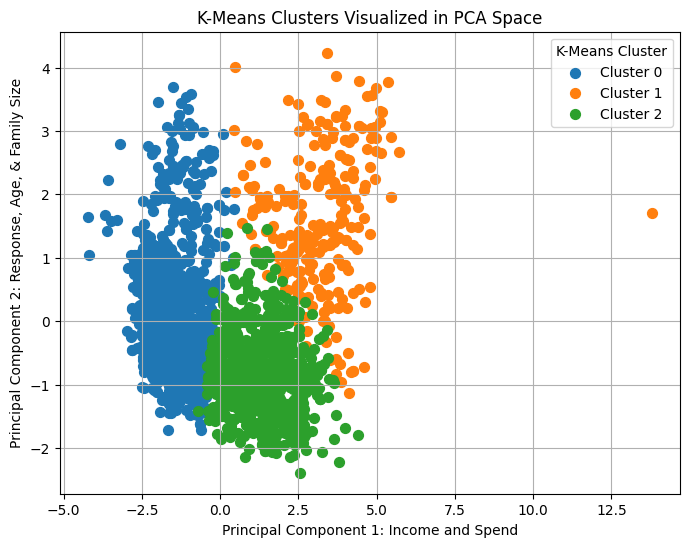

In [ ]:
plt.figure(figsize=(8, 6))

#Plot each cluster separately to map cluster number to the correct color
for cluster in sorted(X_pca_df_kmeans['KMeans_Cluster'].unique()):
    cluster_data = X_pca_df_kmeans[X_pca_df_kmeans['KMeans_Cluster'] == cluster]
    plt.scatter(cluster_data['PC1'], cluster_data['PC2'], label=f'Cluster {cluster}', s=50)

plt.xlabel('Principal Component 1: Income and Spend')
plt.ylabel('Principal Component 2: Response, Age, & Family Size')
plt.title('K-Means Clusters Visualized in PCA Space')
plt.legend(title='K-Means Cluster')
plt.grid(True)
plt.show()


### **Cluster Profiling**

In [ ]:
#Use the final chosen K from elbow method
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_pca_df_kmeans)

#Create DataFrame from original features (X should be your original pre-PCA data)
original_df_kmeans = pd.DataFrame(X, columns=features)  # Replace 'features' with your actual feature names
original_df_kmeans['KMeans_Cluster'] = clusters

#Compute mean feature values per cluster
kmeans_cluster_profiles = original_df_kmeans.groupby('KMeans_Cluster').mean()

#Display the profiles
kmeans_cluster_profiles


,Income,NumWebVisitsMonth,Response,Age,Family_Size,TotalSpent,TotalNumPurchases,AvgSpentPerPurchase,Total_Accepted_Cmp
KMeans_Cluster,,,,,,,,,
0,35897.948805,6.579352,0.099829,43.015358,2.919795,135.697952,9.118601,12.475179,0.087884
1,67219.304938,3.998765,0.016049,48.234568,2.392593,999.400000,21.253086,48.064358,0.202469
2,76199.759690,3.717054,0.790698,45.143411,1.755814,1505.565891,20.903101,81.396395,1.546512


**Observations and Insights:**
-  The chart above shows the three clusters in color against PC1 and PC2.
-  The clusters have distinct separation with minimal overlap.
-  There is at least one outlier.
-  Further analysis will determine the feature makeup of these clusters.

In [ ]:
score = silhouette_score(X_pca, X_pca_df_kmeans['KMeans_Cluster'])#Compute silhouette score
print(f"Silhouette Score: {score:.4f}")

Silhouette Score: 0.2891


### **Describe the characteristics of each cluster**

**Think About It:**
- Are the K-Means profiles providing any deep insights into customer purchasing behavior or which channels they are using?

Yes, the K-Means profiles are providing a distinct separation between three groups in the data indicating meaningful patterns in purchasing behavior and channel usage.

- What is the next step to get more meaningful insights?

The next step to get more meaningful insights is to investigate how different features affect the makeup of these clusters. This will help identify what differentiates each group and uncover meaningful insights to enable stronger marketing, financial, or business decisions.

**Summary of each cluster:**

-  The blue cluster (KMeans_Cluster 0) occupies the lower range of PC1 and almost the entire range of PC2. Based on the feature analysis, a lower PC1 score would entail these customers have less income, spend less, and accept less campaign offers while perhaps having a larger family size and visit the website more frequently.
-  The orange cluster (KMeans_Cluster 1) occupies mainly the high range of PC1 (including one outlier that is very high) and the middle-to-high range of PC2. This indicates that customers in this cluster tend to be high-income and high-spending, and perhaps younger and more responsive.
-  The green cluster (Kmeans_Cluster 2) occupies the middle-to-high range of PC1 and the lower range of PC2. This implies customers in the yellow cluster are likely to be middle-to-high-income, middle-to-high-spending, older, and less responsive.



## **K-Medoids**

In [ ]:
#Choose initial medoid indices (random 3 indices for k=3)
initial_medoids = [0, 1, 2]

#Compute the distance matrix from PCA data
distance_matrix = calculate_distance_matrix(X_pca.tolist())

#Fit K-Medoids
kmedoids_instance = kmedoids(distance_matrix, initial_medoids, data_type='distance_matrix')
kmedoids_instance.process()
clusters = kmedoids_instance.get_clusters()

#Create label array
kmedoids_labels = np.zeros(len(X_pca), dtype=int)
for i, cluster in enumerate(clusters):
    for index in cluster:
        kmedoids_labels[index] = i

#Store in DataFrame
X_pca_df_kmedoids = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])
X_pca_df_kmedoids['KMedoids_Cluster'] = kmedoids_labels

### **Visualize the clusters using PCA**

In [ ]:
#Summary statistics for each cluster
print(X_pca_df_kmedoids.groupby('KMedoids_Cluster').describe())

                     PC1                                                    \
                   count      mean       std       min       25%       50%   
KMedoids_Cluster                                                             
0                 1163.0 -1.568766  0.676749 -4.219192 -2.074524 -1.642105   
1                  264.0  3.033057  1.441781  0.080898  2.225095  3.202505   
2                  813.0  1.259222  0.976649 -0.629185  0.492091  1.197869   

                                          PC2            ...       PC8  \
                       75%        max   count      mean  ...       75%   
KMedoids_Cluster                                         ...             
0                -1.061110   0.769901  1163.0  0.218540  ...  0.258174   
1                 3.973448  13.782667   264.0  1.633513  ...  0.296623   
2                 1.969215   4.407349   813.0 -0.843062  ...  0.219854   

                               PC9                                          \
        

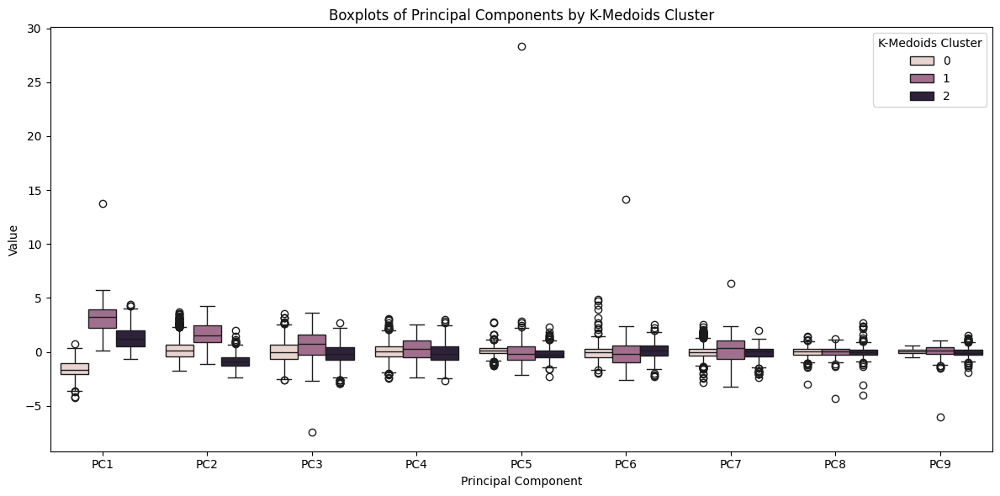

In [ ]:
# Melt the DataFrame into long format
kmedoids_melted = X_pca_df_kmedoids.melt(
    id_vars='KMedoids_Cluster',
    var_name='Principal Component',
    value_name='Value'
)

# Create boxplots
plt.figure(figsize=(12, 6))
sns.boxplot(x='Principal Component', y='Value', hue='KMedoids_Cluster', data=kmedoids_melted)
plt.title("Boxplots of Principal Components by K-Medoids Cluster")
plt.legend(title='K-Medoids Cluster')
plt.tight_layout()
plt.show()

### **Cluster Profiling**

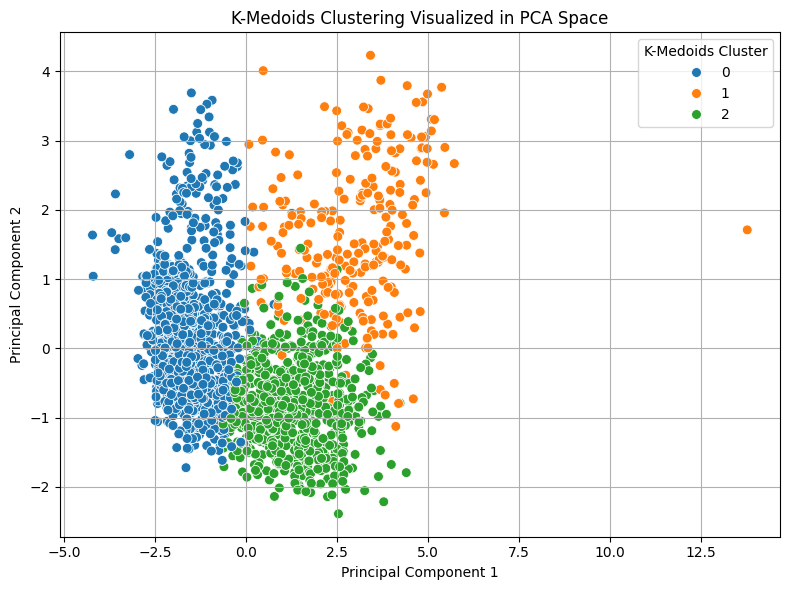

In [ ]:
#Scatterplot of K-Medoids clusters in PCA space
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=X_pca_df_kmedoids,
    x='PC1', y='PC2',
    hue='KMedoids_Cluster',
    palette='tab10',
    s=50
)
plt.title('K-Medoids Clustering Visualized in PCA Space')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='K-Medoids Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#Combine original features with K-Medoids cluster labels
original_df = pd.DataFrame(X, columns=features)  # replace 'features' with actual column names if needed
original_df['KMedoids_Cluster'] = kmedoids_labels

#Get mean values per cluster
cluster_profiles = original_df.groupby('KMedoids_Cluster').mean()

#Display profiles
cluster_profiles


,Income,NumWebVisitsMonth,Response,Age,Family_Size,TotalSpent,TotalNumPurchases,AvgSpentPerPurchase,Total_Accepted_Cmp
KMedoids_Cluster,,,,,,,,,
0,35869.779020,6.627687,0.094583,42.700774,2.954428,140.635426,9.282029,12.502923,0.095443
1,74486.977273,3.954545,0.848485,45.534091,1.863636,1440.337121,20.954545,77.708106,1.454545
2,67402.774908,3.883149,0.000000,48.522755,2.318573,1000.221402,20.870849,48.582374,0.210332


**Observations and Insights:**

The three KMedoids clusters are very similar to the KMeans clusters when charted against principal components 1 & 2. This suggests there are separations in the data that can be reproduced across more than one clustering algorithm.


In [ ]:
score = silhouette_score(X_pca, X_pca_df_kmedoids['KMedoids_Cluster'])#Compute silhouette score
print(f"Silhouette Score: {score:.4f}")

Silhouette Score: 0.2888


### **Characteristics of each cluster**

**Summary for each cluster:**

-  K-Medoids cluster 0  occupies the lower range of PC1 and almost the entire range of PC2.
-  K-Medoids cluster 1 occupies mainly the high range of PC1 (including one outlier that is very high) and the middle-to-high range of PC2.
-  K-Medoids cluster 2 occupies the middle-to-high range of PC1 and the lower range of PC2.

Because the K-Medoids have the roughly the same principal component values, the corresponding features would be reenforced from the previous analysis.


**Observations and Insights:**

*   In relation to PC1 and PC2, the K-Medoids clusters follow the same trends as the K-Means clusters. This suggests there are separations in the variance of the data that can be corroborating using different clustering algorithms.
*   PC3 through PC9 show significant overlap. This suggests that the three K-Medoids clusters are not strongly differentiated along these components and that most of the meaningful separation between clusters is captured in the first two principal component.
*   The outlier in K-Medoids cluster 1 for PC1 is reminiscent of the outlier in K-Means cluster 1. This is likely the same customer, and since PC1's main feature is income, it can be assumed this outlier represents the highest income customer(s).



## **Hierarchical Clustering**

- Find the Cophenetic correlation for different distances with different linkage methods.
- Create the dendrograms for different linkages
- Explore different linkages with each distance metric

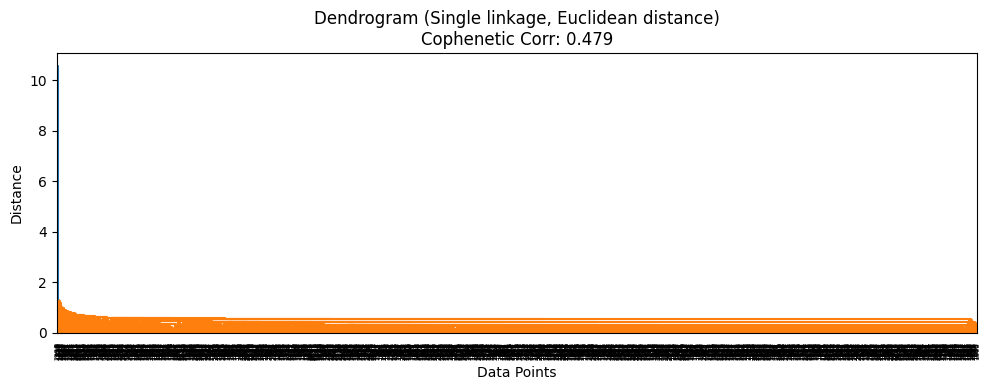

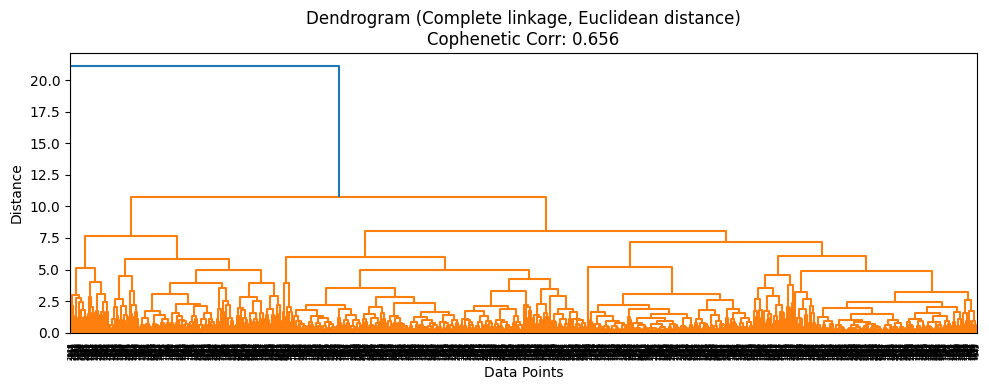

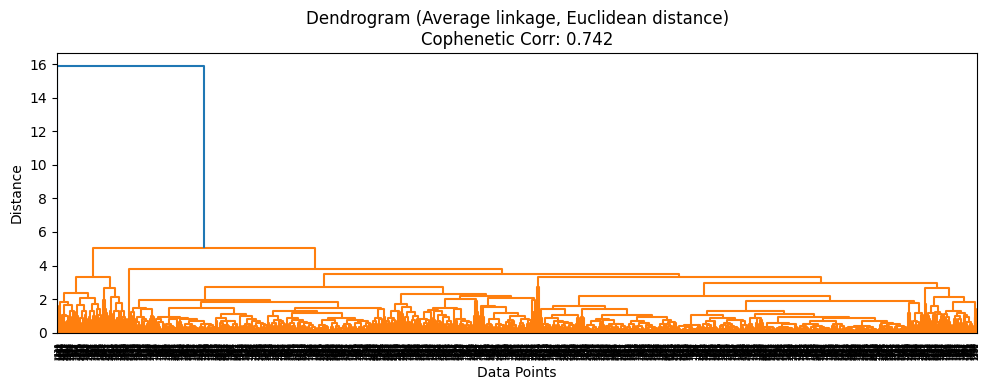

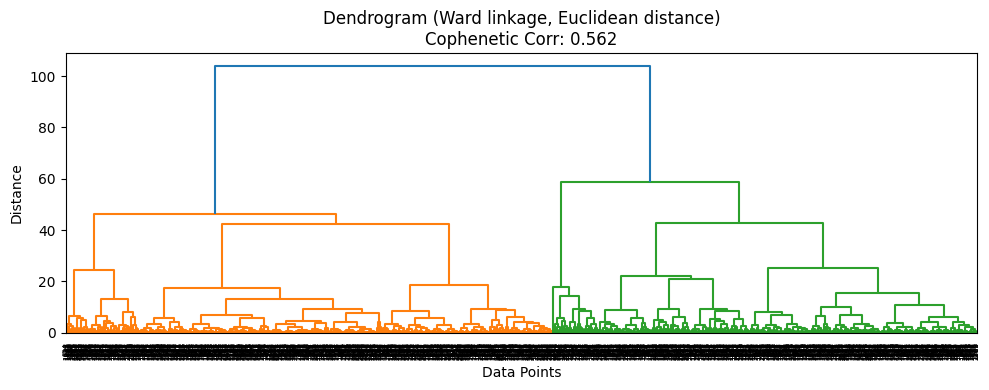

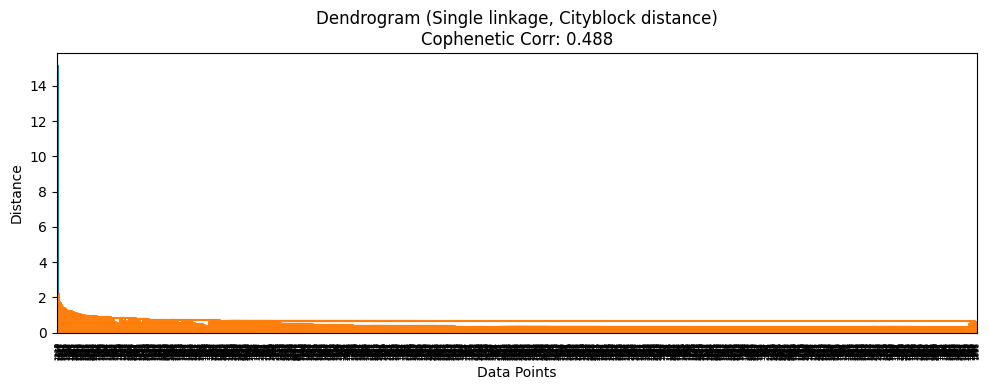

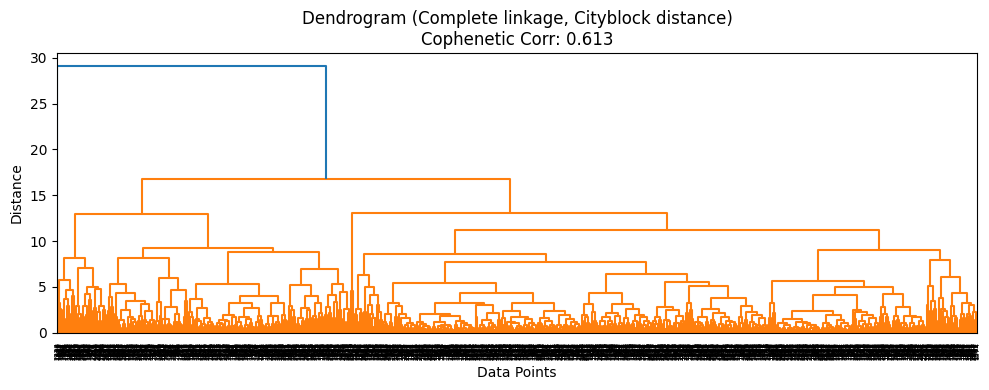

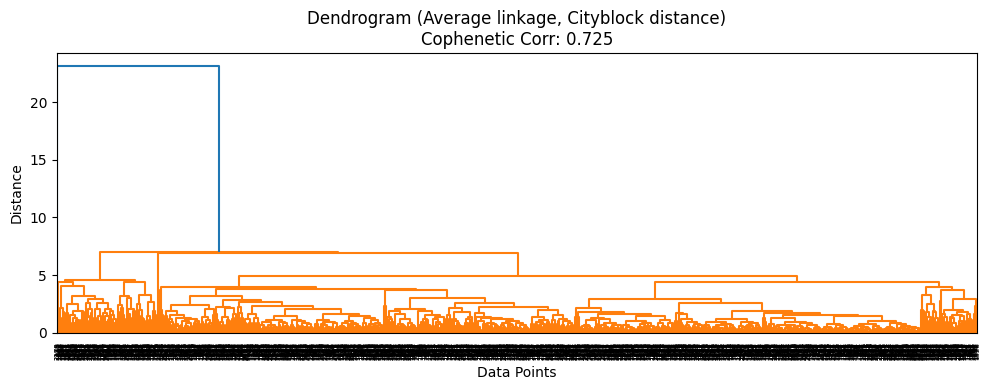

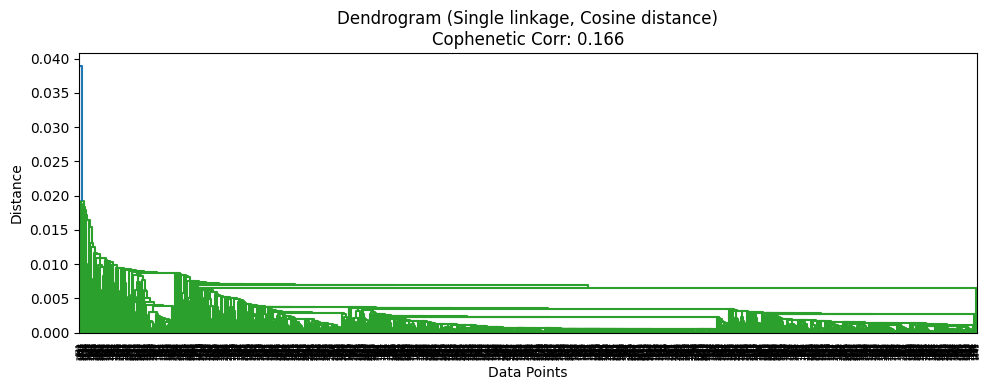

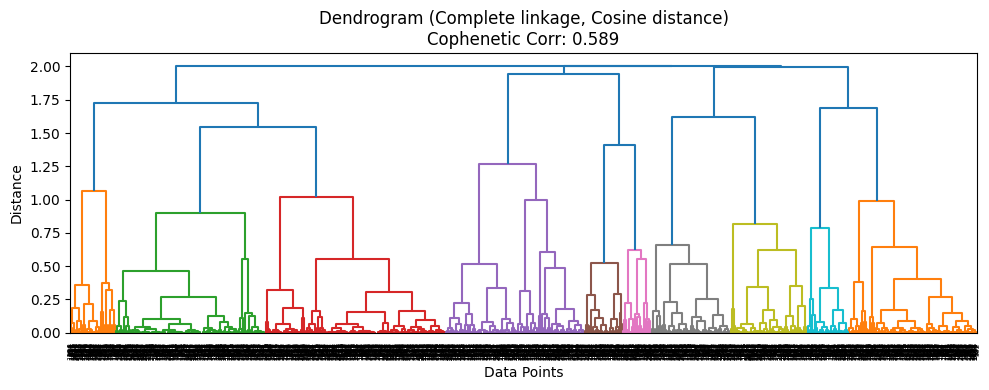

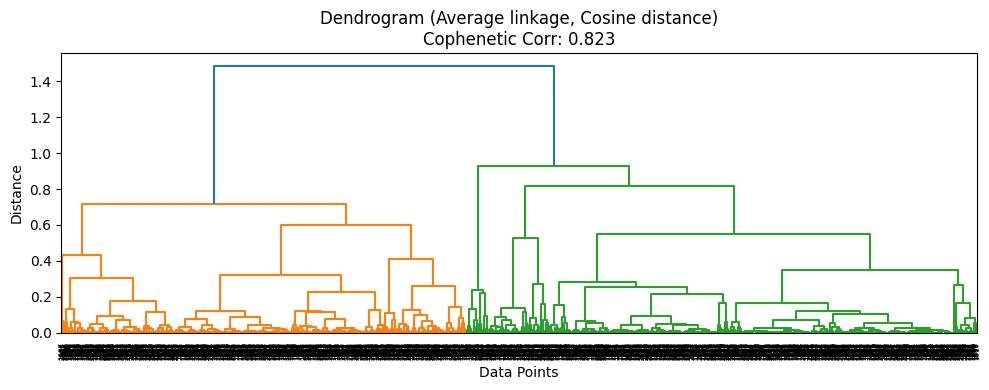

,Linkage,Metric,Cophenetic Corr
9,average,cosine,0.822942
2,average,euclidean,0.741997
6,average,cityblock,0.724742
1,complete,euclidean,0.656088
5,complete,cityblock,0.613172
8,complete,cosine,0.588599
3,ward,euclidean,0.561768
4,single,cityblock,0.488163
0,single,euclidean,0.478985
7,single,cosine,0.165794


In [ ]:
#Use a subset of components (e.g., PC1 to PC5)
X_hier = X_pca[:, :3]  # or however many PCs you want to include

distance_metrics = ['euclidean', 'cityblock', 'cosine']  #You can add 'chebyshev', 'correlation', etc.
linkage_methods = ['single', 'complete', 'average', 'ward']  #'ward' only works with Euclidean

results = []

for metric in distance_metrics:
    for method in linkage_methods:
        if method == 'ward' and metric != 'euclidean':
            continue  #Ward requires Euclidean distance

        #Compute the pairwise distance matrix
        dist_matrix = pdist(X_hier, metric=metric)

        #Perform linkage
        Z = linkage(dist_matrix, method=method)

        #Calculate Cophenetic Correlation Coefficient
        coph_corr, _ = cophenet(Z, dist_matrix)
        results.append({'Linkage': method, 'Metric': metric, 'Cophenetic Corr': coph_corr})

        #Plot dendrogram
        plt.figure(figsize=(10, 4))
        dendrogram(Z)
        plt.title(f'Dendrogram ({method.title()} linkage, {metric.title()} distance)\nCophenetic Corr: {coph_corr:.3f}')
        plt.xlabel('Data Points')
        plt.ylabel('Distance')
        plt.tight_layout()
        plt.show()

results_df = pd.DataFrame(results)
results_df.sort_values(by='Cophenetic Corr', ascending=False, inplace=True)
display(results_df)


**Think about it:**

- Can we clearly decide the number of clusters based on where to cut the dendrogram horizontally?

Based on the hierarchical clustering, there is not a very clear number of clusters where the dendograms show a large vertical jump. However, we may assume 2-4 clusters is appropriate based on the distance measured after cutting those clusters.

- What is the next step in obtaining number of clusters based on the dendrogram?

We can apply fcluster to cut the dendrogram at a threshold, for example t=3, visualize the clusters using PCA, and analyze whether that number of clusters creates a meaningful separation in our data.

- Are there any distinct clusters in any of the dendrograms?

Yes, the dendrogram with linkage average and metric cosine has the highest cophenetic correlation and shows how splitting the data into 2-4 can decrease the most euclidean distance.


### **Visualize the clusters using PCA**

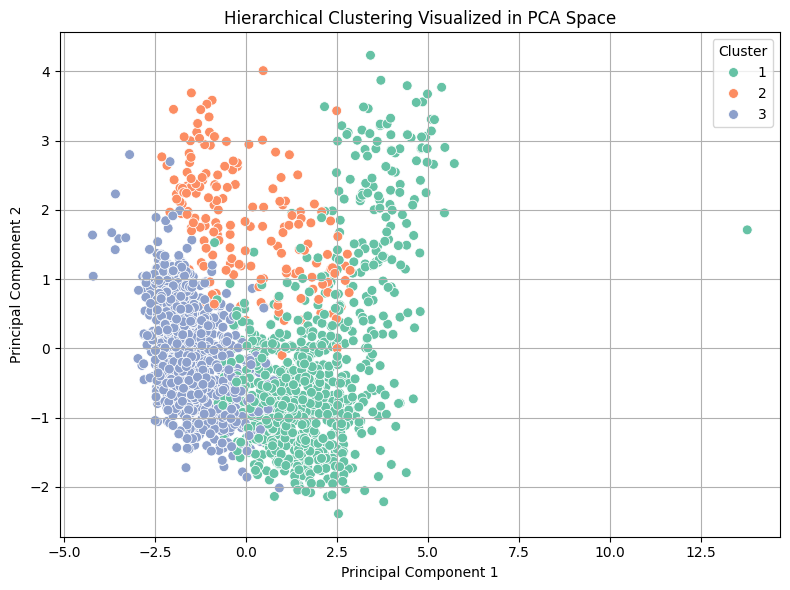

In [ ]:
#Use average linkage with cosine distance
dist_matrix = pdist(X_pca, metric='cosine')
Z = linkage(dist_matrix, method='average')

#Choose the number of clusters (e.g., 3)
n_clusters = 3
hierarchical_labels = fcluster(Z, t=n_clusters, criterion='maxclust')

pca_df_hier = pd.DataFrame(X_pca[:, :2], columns=['PC1', 'PC2'])  # Use first 2 PCs for plotting
pca_df_hier['Hier_Cluster'] = hierarchical_labels


plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df_hier, x='PC1', y='PC2', hue='Hier_Cluster', palette='Set2', s=50)
plt.title('Hierarchical Clustering Visualized in PCA Space')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()


### **Cluster Profiling**

In [ ]:
#Combine original features with hierarchical cluster labels
original_df_hier = pd.DataFrame(X, columns=features)  # replace 'features' with your actual column names
original_df_hier['Hier_Cluster'] = hierarchical_labels

#Compute mean feature values per cluster
hier_cluster_profiles = original_df_hier.groupby('Hier_Cluster').mean()

#Display the profiles
display(hier_cluster_profiles)


,Income,NumWebVisitsMonth,Response,Age,Family_Size,TotalSpent,TotalNumPurchases,AvgSpentPerPurchase,Total_Accepted_Cmp
Hier_Cluster,,,,,,,,,
1,70472.967716,3.791889,0.154749,46.967983,2.251868,1167.028815,21.319104,58.513426,0.570971
2,44183.994709,7.084656,1.000000,45.497354,2.550265,518.111111,15.566138,27.016190,0.417989
3,37518.514587,6.298923,0.000000,43.557451,2.891382,148.616697,9.315081,13.124031,0.046679


**Observations and Insights:**

Although we used 3 clusters in all clustering algorithms, the hierarchical clustering yielded different PC values than the KMeans and K-Medoids algorithms.

The main difference is with the middle cluster on the chart being high on PC2 instead of low.

Further feature analysis will be conducted to elaborate on the characteristic differences between the middle Hierarchical cluster and the middle K-Means/K-Medoids cluster.

In [ ]:
score = silhouette_score(X_pca, pca_df_hier['Hier_Cluster'])#Compute silhouette score
print(f"Silhouette Score: {score:.4f}")

Silhouette Score: 0.2771


### **Characteristics of each cluster**

**Summary of each cluster:**

*   Cluster 1 represents the high-income, high-spending customers that don't visit the website often.
*   Cluster 2 represents only customers that have submitted a response and frequently visit the website. These customers are high-engagement and on average score in the middle on all other variables.
*   Cluster 3 represents only customers that did not submit a Response which also have lower income, have spent less, and almost never accepted campaign offers. These customers may be considered low-engagement.

It appears the Hierarchical clustering algorithm made no separation on age, little separation on family size, and complete separation on responses. This could account for the difference between this clustering and the K-Means/K-Medoids clustering.

## **DBSCAN**

DBSCAN is a very powerful algorithm for finding high-density clusters, but the problem is determining the best set of hyperparameters to use with it. It includes two hyperparameters, `eps`, and `min samples`.

Since it is an unsupervised algorithm, you have no control over it, unlike a supervised learning algorithm, which allows you to test your algorithm on a validation set. The approach we can follow is basically trying out a bunch of different combinations of values and finding the silhouette score for each of them.

In [ ]:
#Store best results
best_score = -1
best_params = {}
scores = []

#Try a grid of eps and min_samples values
for eps in np.arange(0.1, 1.0, 0.1):
    for min_samples in range(3, 8):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_pca)

        #Only evaluate if there is more than 1 cluster (label -1 = noise)
        if len(set(labels)) > 1 and len(set(labels)) != 1 + (1 if -1 in labels else 0):
            score = silhouette_score(X_pca, labels)
            scores.append((eps, min_samples, score))
            if score > best_score:
                best_score = score
                best_params = {'eps': eps, 'min_samples': min_samples}

print(f"Best silhouette score: {best_score:.3f} with eps={best_params['eps']} and min_samples={best_params['min_samples']}")


Best silhouette score: -0.180 with eps=0.9 and min_samples=5


### **Apply DBSCAN for the best hyperparameter and visualize the clusters from PCA**

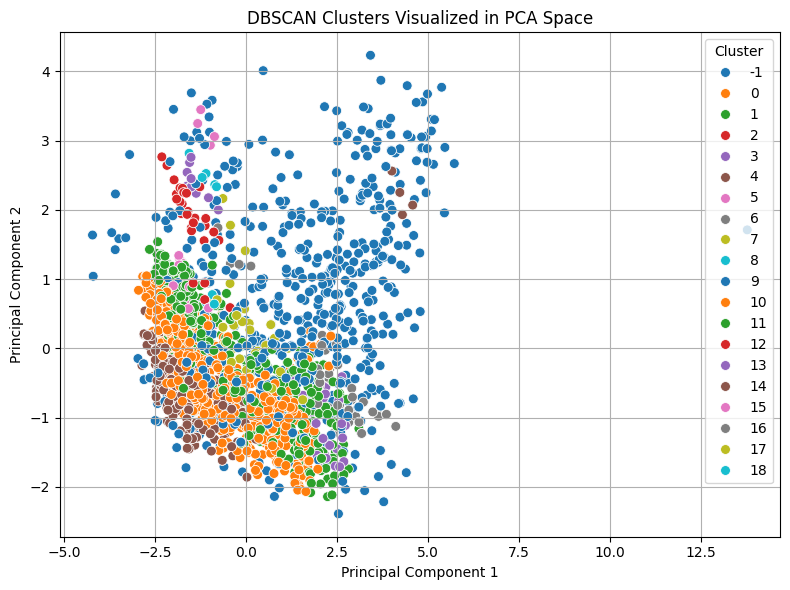

In [ ]:
#Apply DBSCAN with best parameters
dbscan = DBSCAN(eps=best_params['eps'], min_samples=best_params['min_samples'])
dbscan_labels = dbscan.fit_predict(X_pca)

#Create DataFrame for PCA plot
pca_df_dbscan = pd.DataFrame(X_pca[:, :2], columns=['PC1', 'PC2'])  # Use first 2 PCs
pca_df_dbscan['DB_Cluster'] = dbscan_labels

#Visualize the clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df_dbscan, x='PC1', y='PC2', hue='DB_Cluster', palette='tab10', s=50)
plt.title('DBSCAN Clusters Visualized in PCA Space')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()


**Observations and Insights:**

The DBSCAN cluster chart above shows some separation between the larger Orange, green, and blue clusters with some further separation with the smaller brown, purple, gre, red, blue and pink clusters.

Overall, this chart is noisy and there is a lot of overlap between clusters making it difficult to uncover insights.

**Think about it:**

- Changing the eps and min sample values will result in different DBSCAN results? Can we try more value for eps and min_sample?

Yes, DBSCAN is sensitive to eps and min_samples. Trying a wider range of eps and more values of min_samples can lead to more distinct and therefore meaningful clusters, possibly with less noise. This will be done in the code block below.

Silhouette Score with eps=1.5 and min_samples=10: 0.143


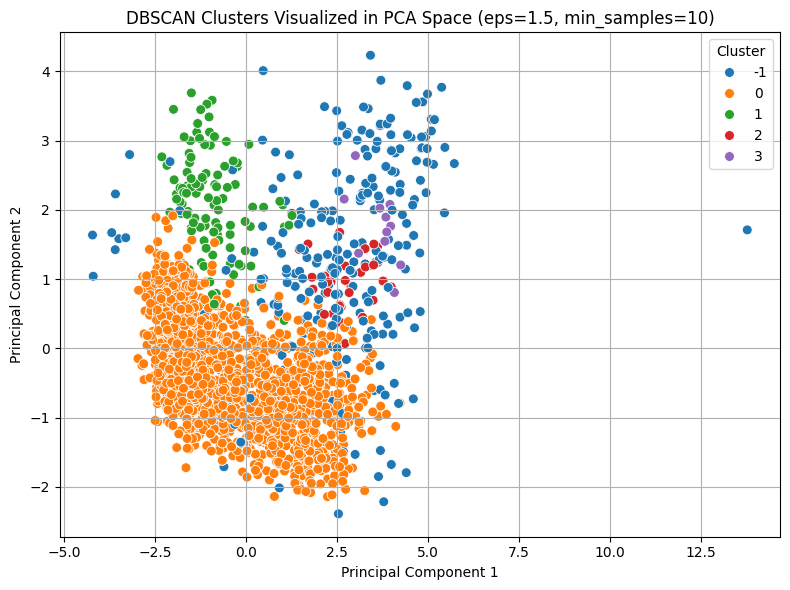

In [ ]:
#Apply DBSCAN with fixed parameters
dbscan = DBSCAN(eps=1.5, min_samples=10)
dbscan_labels = dbscan.fit_predict(X_pca)

#Evaluate silhouette score (if at least 2 clusters exist)
if len(set(dbscan_labels)) > 1 and len(set(dbscan_labels)) != 1 + (1 if -1 in dbscan_labels else 0):
    score = silhouette_score(X_pca, dbscan_labels)
    print(f"Silhouette Score with eps=1.5 and min_samples=10: {score:.3f}")
else:
    print("Not enough clusters to compute silhouette score.")

#Create DataFrame for PCA plot
pca_df_dbscan = pd.DataFrame(X_pca[:, :2], columns=['PC1', 'PC2'])  # Use first 2 PCs
pca_df_dbscan['DB_Cluster'] = dbscan_labels

#Visualize the clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df_dbscan, x='PC1', y='PC2', hue='DB_Cluster', palette='tab10', s=50)
plt.title('DBSCAN Clusters Visualized in PCA Space (eps=1.5, min_samples=10)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

### **Characteristics of each cluster**

**Summary of each cluster:**

-  Cluster -1 is the cluster that varies the most across PC1 and PC2. It includes the outlier at the highest value of PC1, includes the lowest values of PC1, and occupies the full range of PC2 lows and highs.
-  Cluster 0 is the largest cluster and most densely packed. Excluding the datapoints in cluster -1, cluster 0 occupies almost the full range of PC1. However, it occupies only the lower range of PC2, suggesting that this cluster is largely impacted by the variance measured in PC2.
-  Cluster 1 occupies only the lower values of PC1 and higher values of PC2, with overlap into clusters -1 and 0.
-  Cluster 2 occupies the upper range of PC1 and middle range of PC2, with much overlap on clusters -1 and 3. This cluster is comprised of fewer data points.
-  Cluster 3 is also a smaller cluster and overlaps the same location as cluster 2. Perhaps this suggests clusters 2 and 3 should be combined as they hold little meaningful separation on PC1 and PC2.

In [ ]:
score = silhouette_score(X_pca, pca_df_dbscan['DB_Cluster'])#Compute silhouette score
print(f"Silhouette Score: {score:.4f}")

Silhouette Score: 0.1429


####Silhouette Score Improvement Attempt

In [ ]:
best_score = -1
best_params = {}
scores = []

for eps in np.arange(0.5, 3.0, 0.1):  #Creating range of eps
    for min_samples in range(3, 12):#Creating range of min_samples
        db = DBSCAN(eps=eps, min_samples=min_samples)
        labels = db.fit_predict(X_pca)

        #Count actual clusters (excluding noise)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        #Only evaluate if there are exactly 3 clusters
        if n_clusters == 3:
            score = silhouette_score(X_pca, labels)
            scores.append((eps, min_samples, score))
            if score > best_score:
                best_score = score
                best_params = {
                    'eps': eps,
                    'min_samples': min_samples
                }
                best_labels = labels  #Save the actual labels

if best_score != -1:
    print(
        f"Best silhouette score with 3 clusters: {best_score:.4f} "
        f"at eps={best_params['eps']}, min_samples={best_params['min_samples']}"
    )
else:
    print("No combination produced exactly 3 clusters.")


Best silhouette score with 3 clusters: 0.2899 at eps=2.3999999999999995, min_samples=3


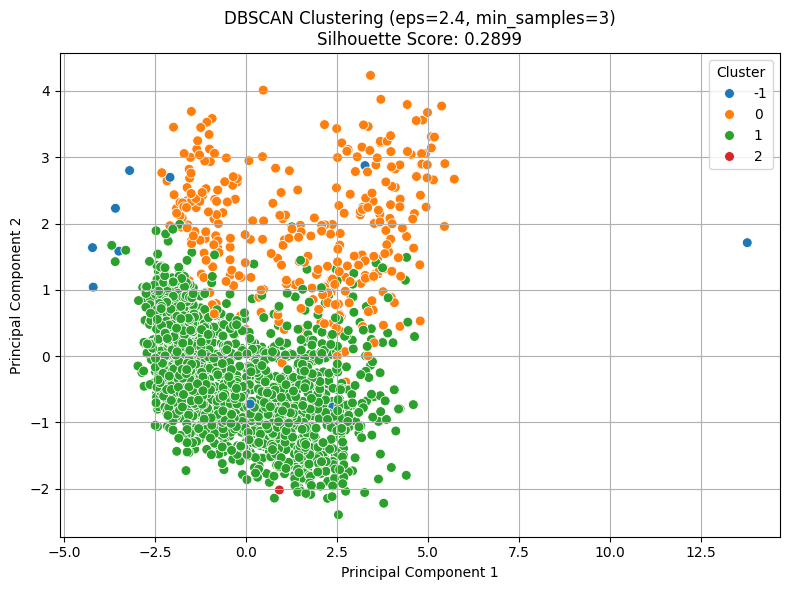

In [ ]:
#Fit DBSCAN with best parameters
dbscan = DBSCAN(eps=2.3999999999999995, min_samples=3)
dbscan_labels = dbscan.fit_predict(X_pca)

#Create a DataFrame with the first 2 principal components and cluster labels
#Use saved labels instead of re-fitting
pca_df_dbscan = pd.DataFrame(X_pca[:, :2], columns=['PC1', 'PC2'])
pca_df_dbscan['Cluster'] = best_labels


#Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df_dbscan, x='PC1', y='PC2', hue='Cluster', palette='tab10', s=50)
plt.title('DBSCAN Clustering (eps=2.4, min_samples=3)\nSilhouette Score: 0.2899')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()


Conclusion: Although DBSCAN yielded a Silhouette score higher than the K-Means score (2.899 vs 2.891), it only created 2 clusters with a less meaningful separation than K-Means.

## **Gaussian Mixture Model**

In [ ]:
#Step 1: Fit Gaussian Mixture Model
n_components = 3  # Adjust based on elbow method or domain knowledge
gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm_labels = gmm.fit_predict(X_pca)

#Step 2: Evaluate the model
silhouette = silhouette_score(X_pca, gmm_labels)
print(f'Silhouette Score for GMM (n_components={n_components}): {silhouette:.3f}')


Silhouette Score for GMM (n_components=3): 0.217


**Observations and Insights:**

A silhouette score of 0.217 suggests that the clusters have weak separation and are not well-defined. This could mean the GMM is not the best model for separating the clusters in our dataset.

### **Visualize the clusters using PCA**

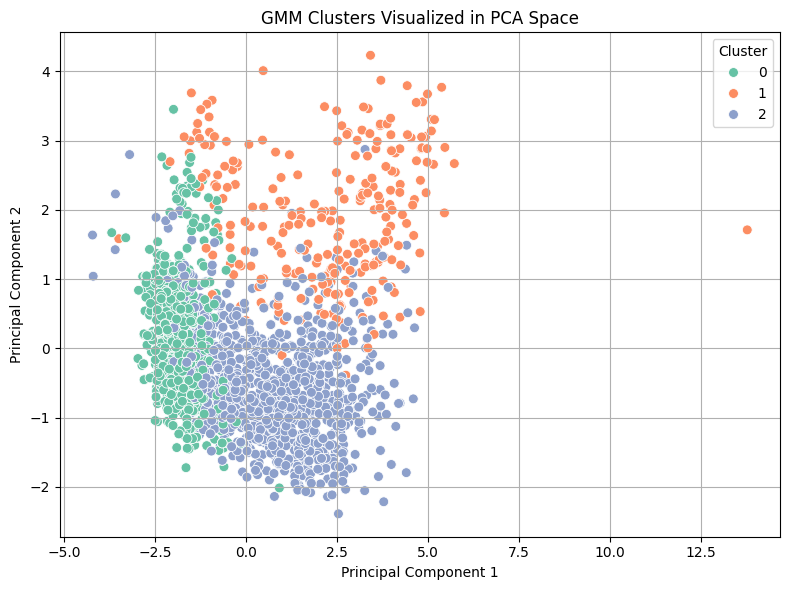

In [ ]:
#Create a DataFrame using first 2 principal components
pca_df_gmm = pd.DataFrame(X_pca[:, :2], columns=['PC1', 'PC2'])
pca_df_gmm['GMM_Cluster'] = gmm_labels

#Plot the clusters in PCA space
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df_gmm, x='PC1', y='PC2', hue='GMM_Cluster', palette='Set2', s=50)
plt.title('GMM Clusters Visualized in PCA Space')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()


### **Cluster Profiling**

In [ ]:
#Create DataFrame of original features with GMM cluster labels
original_df_gmm = pd.DataFrame(X, columns=features)
original_df_gmm['GMM_Cluster'] = gmm_labels

#Group by cluster and compute mean values
gmm_cluster_profiles = original_df_gmm.groupby('GMM_Cluster').mean()

#Display the profile
display(gmm_cluster_profiles)


,Income,NumWebVisitsMonth,Response,Age,Family_Size,TotalSpent,TotalNumPurchases,AvgSpentPerPurchase,Total_Accepted_Cmp
GMM_Cluster,,,,,,,,,
0,33054.494231,6.389744,0.067949,42.351282,2.911538,62.020513,6.846154,8.581526,0.000000
1,65295.611404,4.919298,0.985965,44.912281,2.017544,1146.673684,19.200000,64.479474,1.157895
2,61096.013830,4.700426,0.000000,47.061277,2.525106,835.582979,19.134468,42.113251,0.285957


In [ ]:
score = silhouette_score(X_pca, pca_df_gmm['GMM_Cluster'])#Compute silhouette score
print(f"Silhouette Score: {score:.4f}")

Silhouette Score: 0.2169


**Observations and Insights:**

-  Although the GMM Silhouette score was weak (0.217), plotting the clusters against PC1 and PC2 shows how these clusters are separated in PCA space.
-  Cluster 0 occupies the lower range of PC1 and almost the full range of PC2. This suggests this cluster is primarily influenced by PC1.
-  Cluster 1 occupies the upper range of PC2 and almost the full range of PC1, including the outlier. This suggests cluster 1 is primarily influenced by PC2.
-  Cluster 2 occupies the upper range of PC1 and the lower range of PC2. This suggests that cluster 2 is influenced by both principal components.

In comparison to the other clustering algorithms, the GMM clusters are similar but different at the line of separation between cluster 1 and 2.

Further analysis will determine the actual feature makeup of these clusters.

### **Characteristics of each cluster**

**Summary of each cluster:**

-  Cluster 0 represents our low income customers that spend very little, purchase infrequently, and have never accepted a campaign offer. Due to the low spend and low engagement, this group would not be a good target for marketing campaigns to increase revenue and engagement.
-  The key characteristics in cluster 1 are the high-income, high response rate, high spend, and total campaigns accepted. This group would be a good target in marketing campaigns to receive responses, give out offers, and increase total revenue.
-  Cluster 2 represents our customers that have not responded to any campaings, are older, and score in the middle on other variables. This suggests that this grouping is not open to responding to campaigns, although they still purchase our products and help generate revenue.

## **Conclusion and Recommendations**

**1. Comparison of various techniques and their relative performance based on chosen Metric (Measure of success)**:
- How do different techniques perform? Which one is performing relatively better? Is there scope to improve the performance further?

In this analysis, the following clustering techniques were employed: K-Means, K-Medoids, Hierarchical, DBSCAN, and GMM. Out of all of them, the separation created by K-Means yielded the most meaningful results and was even corroborated by the separation created by K-Medoids. By employing the elbow method, we were able to confidently proceed with K=3 clusters.

By contrast, the Hierarchical clustering did not yield a clear threshold, the DBSCAN yielded too much overlap between clusters, and the GMM yielded a weak silhouette score at 2.17.

In order to improve the performance, further feature engineering can mold the data to provide additional meaningful insights. Additionally, as the company collects more data on its new customers, we will be able to add to the current findings.

**2. Refined insights**:
- What are the most meaningful insights from the data relevant to the problem?

The most meaningful insights are as follows:
*  Income stands out as a feature, yielding the highest impact on PC1. After completing multiple clustering analyses, income was consistently a strong predictor of how much people will spend and how many purchases were made. These are the most valuable customers and should be prioritized for marketing offers and loyalty programs.
*  With all the clustering algorithms, the most appropriate amount of clusters was between 2-4. This suggests that there are at least a couple distinct groups within our customerbase, and looking further out than 4 may not yield more results. It is recommended for future marketing campaigns to fully understand their target cluster in order to effectively promote products.  
*  The amount spent, the number of purchases, and income are for the most part inter-correlated. This means that the high-earners are likely to spend more money, more frequently. If the company is seeking to make more sales, it is important to cater to customers that buy a lot, frequently, and have higher income.
*  Customers that had purchased the most deals also visited the website the most, and spent less than other customers. This suggests there is a distinct group of customers that is only browsing for deals online. From a business perspective, this group of customers may not be the best for generating revenue, but their frequent website visits suggest high engagement.

**3. Proposal for the final solution design:**
- What model do you propose to be adopted? Why is this the best solution to adopt?

The final recommendation is to adopt the K-Means clustering model with 3 clusters. This model segments the customers into actionable groups based on spending capacity and demographics. These groups can be targeted with marketing campaigns, deals, and advertisements. For a refined approach:

- Focus campaign efforts and incentives on Cluster 1 as these customers are high-income which boost total sales and generates more revenue. They are also younger and more responsive to campaigns, suggesting high customer engagement, especially when it comes to marketing.

- Cluster 2 represents the high spenders that are older and less responsive to campaigns. It's possible that these customers would be more responsive to campaigns that are tailored to their age group. Keep this cluster in mind as having untapped potential for high-yield results when it comes to marketing.

- Cluster 0 is not a strong source of revenue and not very responsive. This cluster can be ignored for developing marketing campaigns.

Further iterations should focus on deeper engagement with the high-income younger crowd and tailored marketing to the high-income older crowd. Additionally, it is crucial to incorporate broader survey data to collect more data on our customers and build better more accurate models.

#Final Submission

**1. Expanded Analysis:**

The following actions were taken after the milestone submission to prepare for the final submission:
*   Calculated and compared silhouette scores across models, determining that K-Means offers the cleanest separation overall.

*   Took a deeper look at DBSCAN, which actually had the highest silhouette score of 0.2899 (compared to K-Means at 0.2891) but only when forming 2 clusters and treating several datapoints as noise. Because it only formed 2 clusters, this proved to be less valuable than K-Means which separated the data into 3 meaningful groups.

*   Added a K-Medoids scatterplot cluster visualizations, alongside the existing boxplots, to show the model's consistency with K-Means and validate previous feature-level comparisons between the two clustering algorithms.


**2. Executive Summary:**

Important Findings
*   Income, total spend, and total number of purchases are positively correlated, emerging as the strongest revenue drivers in our data.

Proposed Model Specifications
*   K-Means is the most suitable model for segmenting customers with the highest silhouette score among models with 3 clusters. K-Means yielded clear, interpretable groupings and its validity was reenforced with K-Medoids providing very similar groupings (shown visually in scatterplots against PC1 and PC2).

Next Steps
*   Cluster 1 (K-Means) represents high-income customers who are not responding to current campaigns and spending less. This group tends to be older and has larger families. This group is an untapped market for tailored marketing. Create marketing campaigns that target this audience.

*   Cluster 2 represents our current top-performing customers: High-income, high spend, and high campaign engagement. Continue current marketing campaigns to maintain this group's engagement.

*   Cluster 0: Lower-income and low-revenue customers. This group is not ideal for marketing investment.

**3. Problem and Solution Summary:**

Problem:
*  Our company lacks a clear understanding of the customer base, leading to inefficient marketing and missed revenue opportunities.

Reason for proposed solution design:
*  We needed a solution that would group customers based on behavioral and demographic similarities so we could make targeted, data-driven marketing decisions.
*  To achieve this, we conducted exploratory data analysis and evaluated multiple clustering algorithms (K-Means, K-Medoids, DBSCAN, Hierarchy, GMM) using both silhouette scores and practical interpretability.

Key points of the final proposed solution:
*  Use K-Means clustering to segment customers into three distinct groups because it had the highest silhouette score (when looking at 3 clusters) among models that formed meaningful, interpretable clusters.

*  Base segmentation on PCA-reduced features with high variance, such as income, total spend, and number of purchases.

*  Focus future marketing strategy around these clusters, particularly targeting high-income but under-engaged segments.

How this affects the problem/business:
*  This approach helps us spend our marketing funds more efficiently by focusing on the customers who have the most potential to spend more.

*  By identifying high-potential customers (Cluster 1) who aren’t responding to current outreach, the company can experiment with tailored campaigns that may convert these individuals into loyal customers.


Why this is a valid solution:
*  This solution is valid because it is data-driven and is designed with revenue-related variables and marketing strategies in mind.

**4. Recommendations for Implementation:**

Key recommendations to implement solutions:
*  Launch a targeted marketing campaign specifically for K-Means Cluster 1, representing customers with high income who currently have low engagement.Tailor the marketing campaign for Cluster 1while keeping in mind this group is slightly older with larger family sizes.

*  Continue campaigns with Cluster 2, which already performs well and should be maintained as a revenue stream.

*  Exclude Cluster 0 from marketing initiatives, as they generate little value and would decrease campaign efficiency.

Key actionables for stakeholders:
*  Marketing: Design a marketing campaign to target customers in Cluster 1 based on their higher average age and family size.

*  Research: Collect additional variables on our customers surrounding demographic information, customer satisfaction, and nutritional preferences.

*  Finance: Reallocate budget to focus on Clusters 1 and 2 and reduce spend on Cluster 0.


Benefits & costs:
*  Benefits: Higher marketing ROI by reallocating spend to the most promising segments.

*  Costs: Minor increase in analytics time and marketing development for cluster-specific campaigns.

Key risks and challenges:
*  Risk: Cluster 1 may not respond to marketing despite their high income, leading to lower returns than expected.

*  Challenge: The clusters still have some overlap with a weak silhouette score (~.2891), so misclassification is possible.

*  Risk Mitigation: Start with a small-scale campaign to minimize risk and analyze the results before scaling up.

Further analysis or associated problems:
*  Additional data collection is needed to understand why Cluster 1 underperforms despite similar income levels to Cluster 2.

*  Future analysis should incorporate additional information on our customers to get a more comprehensive picture of demographic information, customer satisfaction, and nutritional preferences. This can help form more accurate clustering models in the future.